# Customer Analysis for AtliQ Hardware <a id='back'></a>


# Introduction 

As a junior analyst at TripleTen World Consultancy, we are working with AtliQ Hardware, a leading computer hardware producer, to conduct a thorough analysis. We're focused on "Customer Analysis - Segmentation of Customers." This involves understanding buying behavior, which is crucial for improving marketing strategies and customer satisfaction, ultimately boosting revenue and profits.


# Project Description 

This project focuses on "Customer Analysis - Segmentation of Customers" for AtliQ Hardware. Our main goal is to uncover insights into customer behavior, preferences, and buying patterns. By doing so, we aim to identify different customer segments and suggest ways to improve business performance and customer engagement.

Throughout the project, we will also test hypotheses to validate our assumptions. For example, we will explore whether Customer Lifetime Value correlates with purchasing platforms, compare customer loyalty across different regions, and assess how various channels influence product diversity.

We will use data stored in the `atliq_db.sqlite3` database, which consists of six tables: `dim_customer`, `dim_product`, `fact_pre_discount`, `fact_manufacturing_cost`, `fact_gross_price`, and `fact_sales_monthly`.
 
This project consists of four stages:
 1. Data overview, cleaning, and preprocessing.
 2. Data analysis.
    * Customer Segmentation.
    * Customer Behavior Analysis.
    * LTV and CAC.
    * Financial Performance Analysis.
    * Product Category Analysis.
 3. Hypothesis testing.
 4. Findings and recommendations. 

## Stage 1. Data overview and preprocessing  

Open the data and explore it. Correct data types. Check for missing values and duplicates. Prepare the data for analysis.

### 1.1 Data overview 

In [4]:
# importing needed libraries
import pandas as pd
import sqlite3
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from IPython.display import Image
from IPython import display

In [10]:
# connecting to the database
con = sqlite3.connect('atliq_db.sqlite3')

# checking all tables in the database
cursor = con.cursor()
cursor.execute("""SELECT name FROM sqlite_master WHERE type='table';""")
print(cursor.fetchall())

[('dim_customer',), ('dim_product',), ('fact_pre_discount',), ('fact_manufacturing_cost',), ('fact_gross_price',), ('fact_sales_monthly',)]


In [11]:
# executing a query to fetch data from the dim_customer table
query="""Select * from dim_customer"""
dim_customer=pd.read_sql_query(query, con)
display(dim_customer.head())
print()
dim_customer.info()

,customer_code,customer,platform,channel,market,sub_zone,region
0,70002017,Atliq Exclusive,Brick & Mortar,Direct,India,India,APAC
1,70002018,Atliq e Store,E-Commerce,Direct,India,India,APAC
2,70003181,Atliq Exclusive,Brick & Mortar,Direct,Indonesia,ROA,APAC
3,70003182,Atliq e Store,E-Commerce,Direct,Indonesia,ROA,APAC
4,70004069,Atliq Exclusive,Brick & Mortar,Direct,Japan,ROA,APAC



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customer_code  209 non-null    int64 
 1   customer       209 non-null    object
 2   platform       209 non-null    object
 3   channel        209 non-null    object
 4   market         209 non-null    object
 5   sub_zone       209 non-null    object
 6   region         209 non-null    object
dtypes: int64(1), object(6)
memory usage: 11.6+ KB


In [12]:
# executing a query to fetch data from the dim_product table
query = """SELECT * FROM dim_product"""
dim_product = pd.read_sql_query(query, con)
display(dim_product.head())
print()
dim_product.info()

,product_code,division,segment,category,product,variant
0,A0118150101,P & A,Peripherals,Internal HDD,AQ Dracula HDD – 3.5 Inch SATA 6 Gb/s 5400 RPM...,Standard
1,A0118150102,P & A,Peripherals,Internal HDD,AQ Dracula HDD – 3.5 Inch SATA 6 Gb/s 5400 RPM...,Plus
2,A0118150103,P & A,Peripherals,Internal HDD,AQ Dracula HDD – 3.5 Inch SATA 6 Gb/s 5400 RPM...,Premium
3,A0118150104,P & A,Peripherals,Internal HDD,AQ Dracula HDD – 3.5 Inch SATA 6 Gb/s 5400 RPM...,Premium Plus
4,A0219150201,P & A,Peripherals,Internal HDD,AQ WereWolf NAS Internal Hard Drive HDD – 8.89 cm,Standard



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 397 entries, 0 to 396
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   product_code  397 non-null    object
 1   division      397 non-null    object
 2   segment       397 non-null    object
 3   category      397 non-null    object
 4   product       397 non-null    object
 5   variant       397 non-null    object
dtypes: object(6)
memory usage: 18.7+ KB


In [13]:
# executing a query to fetch data from the fact_pre_discount table
query = """SELECT * FROM fact_pre_discount"""
fact_pre_discount = pd.read_sql_query(query, con)
display(fact_pre_discount.head())
print()
fact_pre_discount.info()

,customer_code,fiscal_year,pre_invoice_discount_pct
0,70002017,2018,0.0824
1,70002017,2019,0.0777
2,70002017,2020,0.0735
3,70002017,2021,0.0703
4,70002017,2022,0.1057



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1045 entries, 0 to 1044
Data columns (total 3 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_code             1045 non-null   int64  
 1   fiscal_year               1045 non-null   int64  
 2   pre_invoice_discount_pct  1045 non-null   float64
dtypes: float64(1), int64(2)
memory usage: 24.6 KB


In [14]:
# executing a query to fetch data from the fact_manufacturing_cost table
query = """SELECT * FROM fact_manufacturing_cost"""
fact_manufacturing_cost = pd.read_sql_query(query, con)
display(fact_manufacturing_cost.head())
print()
fact_manufacturing_cost.info()

,product_code,cost_year,manufacturing_cost
0,A0118150101,2018,4.6190
1,A0118150101,2019,4.2033
2,A0118150101,2020,5.0207
3,A0118150101,2021,5.5172
4,A0118150102,2018,5.6036



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1182 entries, 0 to 1181
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   product_code        1182 non-null   object 
 1   cost_year           1182 non-null   int64  
 2   manufacturing_cost  1182 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 27.8+ KB


In [15]:
# executing a query to fetch data from the fact_gross_price table
query = """SELECT * FROM fact_gross_price"""
fact_gross_price = pd.read_sql_query(query, con)
display(fact_gross_price.head())
print()
fact_gross_price.info()

,product_code,fiscal_year,gross_price
0,A0118150101,2018,15.3952
1,A0118150101,2019,14.4392
2,A0118150101,2020,16.2323
3,A0118150101,2021,19.0573
4,A0118150102,2018,19.5875



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1182 entries, 0 to 1181
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   product_code  1182 non-null   object 
 1   fiscal_year   1182 non-null   int64  
 2   gross_price   1182 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 27.8+ KB


In [16]:
# executing a query to fetch data from the fact_sales_monthly table
query = """SELECT * FROM fact_sales_monthly"""
fact_sales_monthly = pd.read_sql_query(query, con)
display(fact_sales_monthly.head())
print()
fact_sales_monthly.info()

,date,product_code,customer_code,sold_quantity,fiscal_year
0,2017-09-01,A0118150101,70002017.0,51.0,2018.0
1,2017-09-01,A0118150101,70002018.0,77.0,2018.0
2,2017-09-01,A0118150101,70003181.0,17.0,2018.0
3,2017-09-01,A0118150101,70003182.0,6.0,2018.0
4,2017-09-01,A0118150101,70006157.0,5.0,2018.0



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67251 entries, 0 to 67250
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           67251 non-null  object 
 1   product_code   67251 non-null  object 
 2   customer_code  67250 non-null  float64
 3   sold_quantity  67250 non-null  float64
 4   fiscal_year    67250 non-null  float64
dtypes: float64(3), object(2)
memory usage: 2.6+ MB


### 1.2 Data cleaning

#### 1.2.1 `dim_customer` table

In [17]:
dim_customer.head()

,customer_code,customer,platform,channel,market,sub_zone,region
0,70002017,Atliq Exclusive,Brick & Mortar,Direct,India,India,APAC
1,70002018,Atliq e Store,E-Commerce,Direct,India,India,APAC
2,70003181,Atliq Exclusive,Brick & Mortar,Direct,Indonesia,ROA,APAC
3,70003182,Atliq e Store,E-Commerce,Direct,Indonesia,ROA,APAC
4,70004069,Atliq Exclusive,Brick & Mortar,Direct,Japan,ROA,APAC


In [18]:
# executing a query to check data for missing values using SQL
query = """SELECT
    SUM(CASE WHEN customer_code IS NULL THEN 1 ELSE 0 END) AS missing_customer_code,
    SUM(CASE WHEN customer IS NULL THEN 1 ELSE 0 END) AS missing_customer,
    SUM(CASE WHEN platform IS NULL THEN 1 ELSE 0 END) AS missing_platform,
    SUM(CASE WHEN channel IS NULL THEN 1 ELSE 0 END) AS missing_channel,
    SUM(CASE WHEN market IS NULL THEN 1 ELSE 0 END) AS missing_market,
    SUM(CASE WHEN sub_zone IS NULL THEN 1 ELSE 0 END) AS missing_sub_zone,
    SUM(CASE WHEN region IS NULL THEN 1 ELSE 0 END) AS missing_region
FROM dim_customer
"""
missing_values = pd.read_sql_query(query, con)
missing_values

,missing_customer_code,missing_customer,missing_platform,missing_channel,missing_market,missing_sub_zone,missing_region
0,0,0,0,0,0,0,0


In [19]:
# executing a query to check data for duplicates using SQL
query = """SELECT customer_code, customer, platform, channel, market, sub_zone, region, COUNT(*) AS num_duplicates
FROM dim_customer
GROUP BY customer_code, customer, platform, channel, market, sub_zone, region
HAVING COUNT(*) > 1
"""
duplicates = pd.read_sql_query(query, con)
duplicates

,customer_code,customer,platform,channel,market,sub_zone,region,num_duplicates


Data has no missing values or duplicates. Let's check for implicit duplicates.

In [20]:
# executing a query to check 'customer' column for implicit duplicates using SQL
query = """SELECT DISTINCT customer
FROM dim_customer
ORDER BY customer;
"""
implicit_duplicates = pd.read_sql_query(query, con)
implicit_duplicates['customer'].to_list()

['Acclaimed Stores',
 'All-Out',
 'Amazon',
 'Amazon ',
 "Argos (Sainsbury's)",
 'Atlas Stores',
 'Atliq Exclusive',
 'Atliq e Store',
 'BestBuy',
 'Billa',
 'Boulanger',
 'Chip 7',
 'Chiptec',
 'Circuit City',
 'Control',
 'Coolblue',
 'Costco',
 'Croma',
 'Currys (Dixons Carphone)',
 'Digimarket',
 'Ebay',
 'Electricalsara Stores',
 'Electricalsbea Stores',
 'Electricalslance Stores',
 'Electricalslytical',
 'Electricalsocity',
 'Electricalsquipo Stores',
 'Elite',
 'Elkjøp',
 'Epic Stores',
 'Euronics',
 'Expert',
 'Expression',
 'Ezone',
 'Flawless Stores',
 'Flipkart',
 'Fnac-Darty',
 'Forward Stores',
 'Girias',
 'Info Stores',
 'Insight',
 'Integration Stores',
 'Leader',
 'Logic Stores',
 'Lotus',
 'Mbit',
 'Media Markt',
 'Neptune',
 'Nomad Stores',
 'Notebillig',
 'Nova',
 'Novus',
 'Otto',
 'Path',
 'Power',
 'Premium Stores',
 'Propel',
 'Radio Popular',
 'Radio Shack',
 'Reliance Digital',
 'Relief',
 'Sage',
 'Saturn',
 'Sorefoz',
 'Sound',
 'Staples',
 'Surface Stores',


There is a trailing whitespace in customer name 'Amazon  '. Let's fix it. Also, let's capitalize the first letter of 'walmart', so it looks nicer - the same as other names.

In [21]:
# capitalizing 'Walmart' using Python
#dim_customer['customer'] = dim_customer['customer'].replace('walmart', 'Walmart')

# executing the query do update name 'Walmart' using SQL
query_update_customer = """
UPDATE dim_customer
SET customer = 'Walmart'
WHERE customer = 'walmart';
"""
con.execute(query_update_customer)

# fetching the updated data into the 'dim_customer' DataFrame using SQL
query = "SELECT * FROM dim_customer"
dim_customer = pd.read_sql_query(query, con)
# closing the database connection
#con.close()

# checking the result
#dim_customer['customer'].sort_values().unique()

In [22]:
# executing a query to remove trailing whitespace using SQL
query = """SELECT TRIM(customer) FROM dim_customer"""
dim_customer['customer'] = pd.read_sql_query(query, con)

# removing trailing whitespace using Python
#dim_customer['customer'] = dim_customer['customer'].str.strip()

# checking the result
dim_customer['customer'].sort_values().unique()

array(['Acclaimed Stores', 'All-Out', 'Amazon', "Argos (Sainsbury's)",
       'Atlas Stores', 'Atliq Exclusive', 'Atliq e Store', 'BestBuy',
       'Billa', 'Boulanger', 'Chip 7', 'Chiptec', 'Circuit City',
       'Control', 'Coolblue', 'Costco', 'Croma',
       'Currys (Dixons Carphone)', 'Digimarket', 'Ebay',
       'Electricalsara Stores', 'Electricalsbea Stores',
       'Electricalslance Stores', 'Electricalslytical',
       'Electricalsocity', 'Electricalsquipo Stores', 'Elite', 'Elkjøp',
       'Epic Stores', 'Euronics', 'Expert', 'Expression', 'Ezone',
       'Flawless Stores', 'Flipkart', 'Fnac-Darty', 'Forward Stores',
       'Girias', 'Info Stores', 'Insight', 'Integration Stores', 'Leader',
       'Logic Stores', 'Lotus', 'Mbit', 'Media Markt', 'Neptune',
       'Nomad Stores', 'Notebillig', 'Nova', 'Novus', 'Otto', 'Path',
       'Power', 'Premium Stores', 'Propel', 'Radio Popular',
       'Radio Shack', 'Reliance Digital', 'Relief', 'Sage', 'Saturn',
       'Sorefoz', 'Sou

In [23]:
# executing a query to check for duplicates in 'customer_code' column using SQL. 
# customer codes should be unique 
query = """SELECT customer_code, COUNT(*) AS count_duplicates
FROM dim_customer
GROUP BY customer_code
HAVING count_duplicates > 1"""
customer_code_duplicates = pd.read_sql_query(query, con)
customer_code_duplicates

# checking for duplicates in 'customer_code' column using Python
#dim_customer['customer_code'].duplicated().sum()

,customer_code,count_duplicates


All customer codes are unique.

In [24]:
# checking for unique values in 'channel' column
# should be three of them
dim_customer['channel'].value_counts()

Retailer       164
Direct          40
Distributor      5
Name: channel, dtype: int64

In [25]:
# checking for unique values in 'channel' column
# should be two of them
dim_customer['platform'].value_counts()

Brick & Mortar    150
E-Commerce         59
Name: platform, dtype: int64

In [26]:
# checking for unique values in 'market' column
print(dim_customer['market'].sort_values().unique())
print()

# executing the query do update name 'New Zealand' using SQL
query_update_customer = """
UPDATE dim_customer
SET market = 'New Zealand'
WHERE market = 'Newzealand';
"""
con.execute(query_update_customer)

# fetching the updated data into the 'dim_customer' DataFrame using SQL
query = "SELECT * FROM dim_customer"
dim_customer = pd.read_sql_query(query, con)

# correcting 'New Zealand' name using Python
#dim_customer['market'] = dim_customer['market'].replace('Newzealand', 'New Zealand')

# checking the result
print(dim_customer['market'].sort_values().unique())

['Australia' 'Austria' 'Bangladesh' 'Brazil' 'Canada' 'Chile' 'China'
 'Columbia' 'France' 'Germany' 'India' 'Indonesia' 'Italy' 'Japan'
 'Mexico' 'Netherlands' 'Newzealand' 'Norway' 'Pakistan' 'Philiphines'
 'Poland' 'Portugal' 'South Korea' 'Spain' 'Sweden' 'USA' 'United Kingdom']

['Australia' 'Austria' 'Bangladesh' 'Brazil' 'Canada' 'Chile' 'China'
 'Columbia' 'France' 'Germany' 'India' 'Indonesia' 'Italy' 'Japan'
 'Mexico' 'Netherlands' 'New Zealand' 'Norway' 'Pakistan' 'Philiphines'
 'Poland' 'Portugal' 'South Korea' 'Spain' 'Sweden' 'USA' 'United Kingdom']


In [27]:
# checking for unique values in 'sub_zone' column
dim_customer['sub_zone'].value_counts()

NE       61
SE       44
ROA      38
NA       26
India    18
ANZ      15
LATAM     7
Name: sub_zone, dtype: int64

In [28]:
# checking for unique values in 'region' column
dim_customer['region'].value_counts()

EU       105
APAC      71
NA        26
LATAM      7
Name: region, dtype: int64

Table description says that each customer should have one platform, for one market there should be one sub_zone and one region. Let's check if all those statements are correct.

In [29]:
# executing a query to check if each customer has one platform using SQL
query = """SELECT COUNT(DISTINCT platform) AS num_platforms
FROM dim_customer
GROUP BY customer
HAVING num_platforms > 1"""
unique = pd.read_sql_query(query, con)
unique

,num_platforms


In [30]:
# function to check if each customer or market has only one unique value for the specified category 
# grouping the data by needed column and counting the unique values for the specified category
# checking if all customers or markets have exactly one unique value for the category
def check_unique_values(df, category, column):
    category_count = df.groupby(column)[category].nunique()
    all_unique_values = all(category_count == 1)
    return all_unique_values

# checking if each customer has only one platform
all_customers_have_one_platform = check_unique_values(dim_customer, 'platform', 'customer')
print(f"All customers have one platform: {all_customers_have_one_platform}")

# checking if each market has only one sub_zone
all_markets_have_one_sub_zone = check_unique_values(dim_customer, 'sub_zone', 'market')
print(f"All markets have one sub_zone: {all_markets_have_one_sub_zone}")

# checking if each market has only one region
all_markets_have_one_region = check_unique_values(dim_customer, 'region', 'market')
print(f"All markets have one region: {all_markets_have_one_region}")

All customers have one platform: True
All markets have one sub_zone: True
All markets have one region: True


#### 1.2.2 `dim_product` table

In [31]:
dim_product.head()

,product_code,division,segment,category,product,variant
0,A0118150101,P & A,Peripherals,Internal HDD,AQ Dracula HDD – 3.5 Inch SATA 6 Gb/s 5400 RPM...,Standard
1,A0118150102,P & A,Peripherals,Internal HDD,AQ Dracula HDD – 3.5 Inch SATA 6 Gb/s 5400 RPM...,Plus
2,A0118150103,P & A,Peripherals,Internal HDD,AQ Dracula HDD – 3.5 Inch SATA 6 Gb/s 5400 RPM...,Premium
3,A0118150104,P & A,Peripherals,Internal HDD,AQ Dracula HDD – 3.5 Inch SATA 6 Gb/s 5400 RPM...,Premium Plus
4,A0219150201,P & A,Peripherals,Internal HDD,AQ WereWolf NAS Internal Hard Drive HDD – 8.89 cm,Standard


In [32]:
# checking for duplicates and missing values
print(dim_product.duplicated().sum())
print()
print(dim_product.isna().sum())

0

product_code    0
division        0
segment         0
category        0
product         0
variant         0
dtype: int64


Data has no missing values or duplicates. Let's check for implicit duplicates.

In [33]:
# checking for duplicates in 'product_code' column
# product codes should be unique
dim_product['product_code'].duplicated().sum()

0

All product codes are unique values.

In [34]:
# checking for duplicates in 'division' column
# should be three values
dim_product['division'].value_counts()

P & A    200
PC       161
N & S     36
Name: division, dtype: int64

In [35]:
# checking for duplicates in 'segment' column
# should be six values
dim_product['segment'].value_counts()

Notebook       129
Accessories    116
Peripherals     84
Desktop         32
Storage         27
Networking       9
Name: segment, dtype: int64

In [36]:
# checking for duplicates in 'category' column
dim_product['category'].value_counts()

Personal Laptop                61
Keyboard                       48
Mouse                          48
Business Laptop                44
Gaming Laptop                  40
Graphic Card                   36
MotherBoard                    20
Batteries                      20
Processors                     18
Personal Desktop               16
External Solid State Drives    15
USB Flash Drives               12
Internal HDD                   10
Wi fi extender                  9
Name: category, dtype: int64

In [37]:
# checking for duplicates in 'product' column
dim_product['product'].sort_values().unique()

array(['AQ 5000 Series Electron 8 5900X Desktop Processor',
       'AQ 5000 Series Electron 9 5900X Desktop Processor',
       'AQ 5000 Series Ultron 8 5900X Desktop Processor', 'AQ Aspiron',
       'AQ BZ 101', 'AQ BZ Allin1', 'AQ BZ Allin1 Gen 2', 'AQ BZ Compact',
       'AQ BZ Gen Y', 'AQ BZ Gen Z', 'AQ Clx1', 'AQ Clx2', 'AQ Clx3',
       'AQ Digit', 'AQ Digit SSD',
       'AQ Dracula HDD – 3.5 Inch SATA 6 Gb/s 5400 RPM 256 MB Cache',
       'AQ Electron 3 3600 Desktop Processor',
       'AQ Electron 4 3600 Desktop Processor',
       'AQ Electron 5 3600 Desktop Processor', 'AQ Elite', 'AQ F16',
       'AQ GEN Z', 'AQ GT 21', 'AQ Gamer 1', 'AQ Gamer 2', 'AQ Gamer 3',
       'AQ Gamers ', 'AQ Gamers Ms', 'AQ Gen X', 'AQ Gen Y',
       'AQ HOME Allin1 Gen 2', 'AQ Home Allin1', 'AQ LION x1',
       'AQ LION x2', 'AQ LION x3', 'AQ Lite', 'AQ Lite Ms', 'AQ Lumina',
       'AQ Lumina Ms', 'AQ MB Crossx', 'AQ MB Crossx 2', 'AQ MB Elite',
       'AQ MB Lito', 'AQ MB Lito 2', 'AQ Marquee P3',

There is no implicit duplicates in 'product' column.

In [38]:
# checking for duplicates in 'variant' column
print(dim_product['variant'].sort_values().unique())
print()
# removing trailing whitespace 
# executing a query to remove trailing whitespace 
query = """SELECT TRIM(variant) FROM dim_product"""
dim_product['variant'] = pd.read_sql_query(query, con)

#dim_product['variant'] = dim_product['variant'].str.strip()
print(dim_product['variant'].sort_values().unique())

['Plus' 'Plus 1' 'Plus 1 ' 'Plus 2' 'Plus 3' 'Plus Black' 'Plus Blue'
 'Plus Cool Blue' 'Plus Firey Red' 'Plus Grey' 'Plus Red' 'Premium'
 'Premium 1' 'Premium 2' 'Premium Black' 'Premium Misty Green'
 'Premium Plus' 'Standard' 'Standard 1' 'Standard 2' 'Standard 3'
 'Standard Black' 'Standard Blue' 'Standard Cool Blue'
 'Standard Firey Red' 'Standard Grey' 'Standard Red']

['Plus' 'Plus 1' 'Plus 2' 'Plus 3' 'Plus Black' 'Plus Blue'
 'Plus Cool Blue' 'Plus Firey Red' 'Plus Grey' 'Plus Red' 'Premium'
 'Premium 1' 'Premium 2' 'Premium Black' 'Premium Misty Green'
 'Premium Plus' 'Standard' 'Standard 1' 'Standard 2' 'Standard 3'
 'Standard Black' 'Standard Blue' 'Standard Cool Blue'
 'Standard Firey Red' 'Standard Grey' 'Standard Red']


In [39]:
# saving table in .csv format
dim_product.to_csv('dim_product.csv', index=False)

#### 1.2.3  `fact_pre_discount` table

In [40]:
fact_pre_discount.head()

,customer_code,fiscal_year,pre_invoice_discount_pct
0,70002017,2018,0.0824
1,70002017,2019,0.0777
2,70002017,2020,0.0735
3,70002017,2021,0.0703
4,70002017,2022,0.1057


In [41]:
# checking for duplicates and missing values
print(fact_pre_discount.duplicated().sum())
print()
print(fact_pre_discount.isna().sum())

0

customer_code               0
fiscal_year                 0
pre_invoice_discount_pct    0
dtype: int64


Data has no missing values or duplicates.

In [42]:
# cheking 'fiscal_year' column
fact_pre_discount['fiscal_year'].value_counts()

2018    209
2019    209
2020    209
2021    209
2022    209
Name: fiscal_year, dtype: int64

We have pre-invoice discount information for the five fiscal years, from 2018 to 2022.

In [43]:
# checking if all values of discount % per invoice for specific customer are positive numbers using SQL
query = """SELECT COUNT(CASE WHEN pre_invoice_discount_pct < 0 THEN 1 END) AS total_negative_values
FROM fact_pre_discount
"""
positive_discount = pd.read_sql_query(query, con)
positive_discount

# checking if all values of discount % per invoice for specific customer are positive using Python
#all_positive = all(fact_pre_discount['pre_invoice_discount_pct'] >= 0)
#print(f"All discount values are positive : {all_positive}")

,total_negative_values
0,0


In [44]:
# saving table in .csv format
fact_pre_discount.to_csv('fact_pre_discount.csv', index=False)

####  1.2.4 `fact_manufacturing_cost` table

In [45]:
fact_manufacturing_cost.head()

,product_code,cost_year,manufacturing_cost
0,A0118150101,2018,4.6190
1,A0118150101,2019,4.2033
2,A0118150101,2020,5.0207
3,A0118150101,2021,5.5172
4,A0118150102,2018,5.6036


In [46]:
# checking for duplicates and missing values
print(fact_manufacturing_cost.duplicated().sum())
print()
print(fact_manufacturing_cost.isna().sum())

0

product_code          0
cost_year             0
manufacturing_cost    0
dtype: int64


In [47]:
# checking 'fiscal_year' column
fact_manufacturing_cost['cost_year'].unique()

array([2018, 2019, 2020, 2021, 2022])

We have information on products gross price for the five years, from 2018 to 2022, the same as for pre-invoice discount information.

In [48]:
# checking if all values of manufacturing cost are higher than 0
all_positive_cost = all(fact_manufacturing_cost['manufacturing_cost'] > 0)
print(f"All manufacturing costs are positive values: {all_positive_cost}")

All manufacturing costs are positive values: True


In [49]:
# saving table in .csv format
fact_manufacturing_cost.to_csv('fact_manufacturing_cost.csv', index=False)

#### 1.2.5  `fact_gross_price` table

In [50]:
fact_gross_price.head()

,product_code,fiscal_year,gross_price
0,A0118150101,2018,15.3952
1,A0118150101,2019,14.4392
2,A0118150101,2020,16.2323
3,A0118150101,2021,19.0573
4,A0118150102,2018,19.5875


In [51]:
# checking for duplicates and missing values
print(fact_gross_price.duplicated().sum())
print()
print(fact_gross_price.isna().sum())

0

product_code    0
fiscal_year     0
gross_price     0
dtype: int64


Data has no missing values or duplicates.

In [52]:
# checking 'fiscal_year' column
fact_gross_price['fiscal_year'].unique()

array([2018, 2019, 2020, 2021, 2022])

We have information on products gross price for the five fiscal years, from 2018 to 2022, the same as for pre-invoice discount  and manufacturing cost information.

In [53]:
# checking if all values of gross price higher than 0. Pruducts cannot sell for free.
all_positive_price = all(fact_gross_price['gross_price'] > 0)
print(f"All gross price are positive values: {all_positive_price}")

All gross price are positive values: True


In [54]:
# saving table in .csv format
fact_gross_price.to_csv('fact_gross_price.csv', index=False)

#### 1.2.6 `fact_sales_monthly` table

In [55]:
fact_sales_monthly.head()

,date,product_code,customer_code,sold_quantity,fiscal_year
0,2017-09-01,A0118150101,70002017.0,51.0,2018.0
1,2017-09-01,A0118150101,70002018.0,77.0,2018.0
2,2017-09-01,A0118150101,70003181.0,17.0,2018.0
3,2017-09-01,A0118150101,70003182.0,6.0,2018.0
4,2017-09-01,A0118150101,70006157.0,5.0,2018.0


In [56]:
# checking for duplicates and missing values
print(fact_sales_monthly.duplicated().sum())
print()
print(fact_sales_monthly.isna().sum())

0

date             0
product_code     0
customer_code    1
sold_quantity    1
fiscal_year      1
dtype: int64


Data has no duplicates, but there are missing values in 'customer_code', 'sold_quantity', and 'fiscal_year' columns. Let's look at them closer.

In [57]:
# executing a query to extract all rows with missing values using SQL
query = """SELECT *
FROM fact_sales_monthly
WHERE customer_code IS NULL OR
      sold_quantity IS NULL OR
      fiscal_year IS NULL
      """
missing_sales =  pd.read_sql_query(query, con)
missing_sales

# extracting all rows with missing values using Python
#fact_sales_monthly[fact_sales_monthly.isnull().any(axis=1)]

,date,product_code,customer_code,sold_quantity,fiscal_year
0,2019-06-01,A0,None,None,None


There is just one row with missing values. This row doesn't have any needed information, so we can definitely drop it.

In [58]:
# executing the query to delete rows with missing values
query_drop_missing_values = """
DELETE FROM fact_sales_monthly
WHERE customer_code IS NULL OR 
      sold_quantity IS NULL OR 
      fiscal_year IS NULL;
"""
con.execute(query_drop_missing_values)
# committing the changes to the database
con.commit()
# fetching the updated data into the 'fact_sales_monthly' DataFrame using SQL
query = "SELECT * FROM fact_sales_monthly"
fact_sales_monthly = pd.read_sql_query(query, con)

# dropping the row with missing values using Python
#fact_sales_monthly = fact_sales_monthly.dropna()

# checking the result
fact_sales_monthly.isna().sum()

date             0
product_code     0
customer_code    0
sold_quantity    0
fiscal_year      0
dtype: int64

In [59]:
# checking data types
fact_sales_monthly.dtypes

date             object
product_code     object
customer_code     int64
sold_quantity     int64
fiscal_year       int64
dtype: object

After deleting the row with missing valus the data types of the 'customer_code', 'sold_quantity', and 'fiscal_year' columns changed from float to integer. But we still need to change the data type of the 'date' column to datetime.

In [60]:
# changing data type object to datetime using Python
fact_sales_monthly['date'] = pd.to_datetime(fact_sales_monthly['date'], format='%Y-%m-%d')
# checking the result
fact_sales_monthly.dtypes

date             datetime64[ns]
product_code             object
customer_code             int64
sold_quantity             int64
fiscal_year               int64
dtype: object

In [61]:
# checking the date range
print(fact_sales_monthly['date'].min(), fact_sales_monthly['date'].max())

2017-09-01 00:00:00 2021-12-01 00:00:00


In [62]:
# checking 'fiscal_year' column
fact_sales_monthly['fiscal_year'].unique()

array([2018, 2019, 2020, 2021, 2022])

We have information on monthly sales for the five fiscal years, from 2018 to 2022, the same as for pre-invoice discount and products gross price information.

In [63]:
# checking if all values of quantities are higher than 0
all_positive_quantity = all(fact_sales_monthly['sold_quantity'] > 0)
print(f"All quantities are higher than 0: {all_positive_quantity}")

All quantities are higher than 0: False


In [64]:
# determining the minimum value of a column
fact_sales_monthly['sold_quantity'].min()

0

In [65]:
# calculating the number of rows where sold_quantity = 0
fact_sales_monthly[fact_sales_monthly['sold_quantity'] == 0].count()

date             72
product_code     72
customer_code    72
sold_quantity    72
fiscal_year      72
dtype: int64

We have 72 rows where the sold quantity is 0. Let's remove them since no purchase was made.

In [66]:
fact_sales_monthly = fact_sales_monthly[fact_sales_monthly['sold_quantity'] > 0]
# checking the result
all_positive_quantity = all(fact_sales_monthly['sold_quantity'] > 0)
print(f"All quantities are higher than 0: {all_positive_quantity}")

All quantities are higher than 0: True


### 1.3 Data preprocessing

Creating a new table with calculated total order gross (after pre invoice discount).

In [67]:
# merging tables to get all needed data 
total_sales_monthly = (fact_sales_monthly.merge(fact_gross_price, on=['product_code', 'fiscal_year'])
                                .merge(fact_pre_discount, on=['customer_code', 'fiscal_year']))
total_sales_monthly.head()

,date,product_code,customer_code,sold_quantity,fiscal_year,gross_price,pre_invoice_discount_pct
0,2017-09-01,A0118150101,70002017,51,2018,15.3952,0.0824
1,2017-10-01,A0118150101,70002017,54,2018,15.3952,0.0824
2,2017-11-01,A0118150101,70002017,30,2018,15.3952,0.0824
3,2018-01-01,A0118150101,70002017,14,2018,15.3952,0.0824
4,2018-02-01,A0118150101,70002017,62,2018,15.3952,0.0824


In [68]:
# calculating order price before pre invoice discount
total_sales_monthly['order_price'] = total_sales_monthly['sold_quantity'] * total_sales_monthly['gross_price']

# calculating order price after pre invoice discount
total_sales_monthly['revenue'] = (total_sales_monthly['order_price'] 
                                 - total_sales_monthly['order_price'] * total_sales_monthly['pre_invoice_discount_pct'])

# dropping not needed columns
total_sales_monthly = total_sales_monthly.drop(['gross_price', 'pre_invoice_discount_pct', 'order_price', 'sold_quantity'], axis=1)
total_sales_monthly.head()

,date,product_code,customer_code,fiscal_year,revenue
0,2017-09-01,A0118150101,70002017,2018,720.458412
1,2017-10-01,A0118150101,70002017,2018,762.838318
2,2017-11-01,A0118150101,70002017,2018,423.799066
3,2018-01-01,A0118150101,70002017,2018,197.772897
4,2018-02-01,A0118150101,70002017,2018,875.851402


Creating a new table with calculated total order manufacturing cost.

In [69]:
# extracting order year from 'date' column so we can merge 'fact_manufacturing_cost' table
fact_sales_monthly['cost_year'] = fact_sales_monthly['date'].dt.year
fact_sales_monthly.head()

,date,product_code,customer_code,sold_quantity,fiscal_year,cost_year
0,2017-09-01,A0118150101,70002017,51,2018,2017
1,2017-09-01,A0118150101,70002018,77,2018,2017
2,2017-09-01,A0118150101,70003181,17,2018,2017
3,2017-09-01,A0118150101,70003182,6,2018,2017
4,2017-09-01,A0118150101,70006157,5,2018,2017


In [70]:
# saving table in .csv format
fact_sales_monthly.to_csv('fact_sales_monthly.csv', index=False)

In [71]:
# merging tables
total_manufacturing_costs = fact_sales_monthly.merge(fact_manufacturing_cost, on=['product_code', 'cost_year']).drop('cost_year', axis=1)
total_manufacturing_costs.head()

,date,product_code,customer_code,sold_quantity,fiscal_year,manufacturing_cost
0,2018-01-01,A0118150101,70002017,14,2018,4.619
1,2018-01-01,A0118150101,70002018,17,2018,4.619
2,2018-01-01,A0118150101,70003181,16,2018,4.619
3,2018-01-01,A0118150101,70003182,8,2018,4.619
4,2018-01-01,A0118150101,70006157,2,2018,4.619


In [72]:
# calculating total order manufacturing cost
total_manufacturing_costs['order_manufacturing_cost'] = (total_manufacturing_costs['sold_quantity'] 
                                                              * total_manufacturing_costs['manufacturing_cost'])

# dropping not needed columns
total_manufacturing_costs = total_manufacturing_costs.drop(['manufacturing_cost', 'sold_quantity'], axis=1)
total_manufacturing_costs.head()

,date,product_code,customer_code,fiscal_year,order_manufacturing_cost
0,2018-01-01,A0118150101,70002017,2018,64.666
1,2018-01-01,A0118150101,70002018,2018,78.523
2,2018-01-01,A0118150101,70003181,2018,73.904
3,2018-01-01,A0118150101,70003182,2018,36.952
4,2018-01-01,A0118150101,70006157,2018,9.238


### 1.4 Conclusions

* The data consists of six tables that store information on customers, products, sales, discounts and product price and product manufacturing costs. 
* Data has no duplicates.
* Missing values were found in `fact_sales_monthly` table. One row with missing values was removed.
* Implicit duplicates in `dim_customer` table were fixed by trimming the whitwspace.
* The data in `fact_sales_monthly` table was optimized for analysis by changing the data types.
* All statements from `dim_customer` table description are correct:  each customer has one platform, for one market there is one sub_zone and one region.
* 72 rows with the sold quantity of 0 were removed, since no purchase was made.
* We have information for five fiscal years - from 2018 to 2022.
* Two new tables were created: `total_sales_data` with calculated total order revenue and `total_manufacturing_costs` with total order manufacturing cost calculated.
* It's clear that the data is sufficient to alalyze.

## Stage 2. Data Analysis 

###  2.1 Customer Segmentation:

We will segment customers based on platform, channel, and region to identify distinct customer groups using a combination of these attributes as the segment identifier.

In [73]:
# creating customer segments based on platform, channel, and region
# creating a column with customer segments in 'dim_customer' table
query = """SELECT
    c.*,
    c.platform || '_' || c.channel || '_' || c.region AS customer_segment
FROM
    dim_customer AS c
"""
# executing the query
dim_customer = pd.read_sql_query(query, con)
# checking the result
dim_customer.head()

,customer_code,customer,platform,channel,market,sub_zone,region,customer_segment
0,70002017,Atliq Exclusive,Brick & Mortar,Direct,India,India,APAC,Brick & Mortar_Direct_APAC
1,70002018,Atliq e Store,E-Commerce,Direct,India,India,APAC,E-Commerce_Direct_APAC
2,70003181,Atliq Exclusive,Brick & Mortar,Direct,Indonesia,ROA,APAC,Brick & Mortar_Direct_APAC
3,70003182,Atliq e Store,E-Commerce,Direct,Indonesia,ROA,APAC,E-Commerce_Direct_APAC
4,70004069,Atliq Exclusive,Brick & Mortar,Direct,Japan,ROA,APAC,Brick & Mortar_Direct_APAC


In [74]:
# calculating the number of customer segments
print(dim_customer['customer_segment'].nunique())

16


In [75]:
# calculating the number of unique customers in each segment
dim_customer.groupby('customer_segment')['customer_code'].nunique().sort_values(ascending=False)

customer_segment
Brick & Mortar_Retailer_EU         76
Brick & Mortar_Retailer_APAC       35
Brick & Mortar_Retailer_NA         16
E-Commerce_Retailer_APAC           14
E-Commerce_Retailer_EU             12
E-Commerce_Direct_EU               11
E-Commerce_Direct_APAC              9
Brick & Mortar_Direct_APAC          8
Brick & Mortar_Direct_EU            6
E-Commerce_Retailer_NA              6
Brick & Mortar_Distributor_APAC     5
E-Commerce_Retailer_LATAM           3
Brick & Mortar_Direct_NA            2
Brick & Mortar_Retailer_LATAM       2
E-Commerce_Direct_LATAM             2
E-Commerce_Direct_NA                2
Name: customer_code, dtype: int64

In [76]:
# saving table in .csv format
dim_customer.to_csv('dim_customer.csv', index=False)

##### Conclusions

We identified 16 unique customer segments based on platform, channel, and region. Among these segments, the Brick & Mortar_Retailer_EU segment had the highest number of customers (72), while segments like Brick & Mortar_Direct_NA, Brick & Mortar_Retailer_LATAM, E-Commerce_Direct_LATAM, and E-Commerce_Direct_NA had a minimum of 2 customers each.

### 2.2 Customer Behavior Analysis:

#### 2.2.1 Calculate customer retention rate to assess customer loyalty over time.

Analyze customer retention rate through monthly cohort analysis. This involves tracking how many customers continue using a product over time. We group customers into cohorts and calculate how many stay engaged. This helps us understand customer loyalty and the effectiveness of our services.

###### Retention rate monthly cohort analysis

Retention rate monthly cohort analysis shows us the percentage of customers from a specific cohort who continue to engage and make repeat purchases over time. It provides insights into the level of customer loyalty and satisfaction, indicating how effective a business is at retaining its customer base. A higher retention rate signifies that a larger proportion of customers from a particular cohort remain active and engaged, indicating strong brand loyalty and positive customer experiences. On the other hand, a lower retention rate may suggest issues with product quality, customer service, or overall value proposition. Retention rate analysis helps businesses assess the success of their efforts in maintaining long-term customer relationships and guides strategies for improving customer retention and engagement.

To compute the retention rate, we need to divide the count of active users in a specific lifetime month for each cohort by the initial number of users in that cohort. To do that we need to follow these steps: form cohorts by grouping customers based on their first interaction month, determine user lifetimes within each cohort, and calculate the number of active customers within each cohort and the number of initial customers in each cohort.

In [77]:
fact_sales_monthly.head()

,date,product_code,customer_code,sold_quantity,fiscal_year,cost_year
0,2017-09-01,A0118150101,70002017,51,2018,2017
1,2017-09-01,A0118150101,70002018,77,2018,2017
2,2017-09-01,A0118150101,70003181,17,2018,2017
3,2017-09-01,A0118150101,70003182,6,2018,2017
4,2017-09-01,A0118150101,70006157,5,2018,2017


In [78]:
dim_customer.head()

,customer_code,customer,platform,channel,market,sub_zone,region,customer_segment
0,70002017,Atliq Exclusive,Brick & Mortar,Direct,India,India,APAC,Brick & Mortar_Direct_APAC
1,70002018,Atliq e Store,E-Commerce,Direct,India,India,APAC,E-Commerce_Direct_APAC
2,70003181,Atliq Exclusive,Brick & Mortar,Direct,Indonesia,ROA,APAC,Brick & Mortar_Direct_APAC
3,70003182,Atliq e Store,E-Commerce,Direct,Indonesia,ROA,APAC,E-Commerce_Direct_APAC
4,70004069,Atliq Exclusive,Brick & Mortar,Direct,Japan,ROA,APAC,Brick & Mortar_Direct_APAC


To calculate retention rate, we will perform monthly cohort analysis.

In [79]:
# extracting needed data by merging 'fact_sales_monthly' and 'dim_customer' tables
retention_data = (fact_sales_monthly[['date', 'customer_code', 'fiscal_year']]
                  .merge(dim_customer[['customer_code', 'customer_segment']],on='customer_code'))
                  
#retention_data.head()

First, we need to retrieve the date of the first iteration for each customer and form cohorts. 

In [80]:
# retrieving the date of the first order for each customer
first_order_date = retention_data.groupby('customer_code')['date'].min()
# renaming the column to avoid repetitions in column names
first_order_date.name = 'first_order_date' 

# adding date of the first session to 'retention_data' table by merging two tables
retention_data_monthly = retention_data.merge(first_order_date, on='customer_code')

# exrtracting first session month
retention_data_monthly['cohort_month'] = retention_data_monthly['first_order_date'].astype('datetime64[M]')

# calculating cohort lifetime (age)
retention_data_monthly['cohort_lifetime'] = (pd.to_datetime(retention_data_monthly['date']) 
                                             - pd.to_datetime(retention_data_monthly['cohort_month']))

# converting the lifetime duration to months 
# storing the results to a new column 'cohort_lifetime'
retention_data_monthly['cohort_lifetime'] = ((retention_data_monthly['cohort_lifetime'] 
                                              / np.timedelta64(1, 'M')).round().astype(int))
retention_data_monthly.head()

,date,customer_code,fiscal_year,customer_segment,first_order_date,cohort_month,cohort_lifetime
0,2017-09-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,0
1,2017-10-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,1
2,2017-11-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,2
3,2018-01-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,4
4,2018-02-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,5


In [81]:
# creating new table 'cohorts' with the numbers of active users at a certain cohort age for each cohort
cohorts = retention_data_monthly.groupby(['cohort_month', 'cohort_lifetime']).agg({'customer_code':'nunique'
                                                                                  }).reset_index()
# renaming the column
cohorts = cohorts.rename(columns = {'customer_code':'n_customers'})
cohorts.head()

,cohort_month,cohort_lifetime,n_customers
0,2017-09-01,0,75
1,2017-09-01,1,51
2,2017-09-01,2,50
3,2017-09-01,3,49
4,2017-09-01,4,75


In [82]:
# extracting the initial numbers of users in each cohort
initial_customers_count = cohorts[cohorts['cohort_lifetime'] == 0][['cohort_month', 'n_customers']]
# renaming the column
initial_customers_count = initial_customers_count.rename(columns = {'n_customers':'n_customers_initial'})
#initial_users_count

In [83]:
# adding initial users to 'cohorts' table
cohorts = cohorts.merge(initial_customers_count, on='cohort_month')
#cohorts.head()

In [84]:
# calculating the retention rate
# storing results to a new column 
cohorts['retention'] = (cohorts['n_customers'] / cohorts['n_customers_initial'])
cohorts.head()

,cohort_month,cohort_lifetime,n_customers,n_customers_initial,retention
0,2017-09-01,0,75,75,1.000000
1,2017-09-01,1,51,75,0.680000
2,2017-09-01,2,50,75,0.666667
3,2017-09-01,3,49,75,0.653333
4,2017-09-01,4,75,75,1.000000


In [85]:
# building a pivot table to calculate retention rate per cohort monthly, filling NaNs with 0
retention_pivot_monthly = cohorts.pivot_table(index='cohort_month',
                                      columns='cohort_lifetime',
                                      values='retention',
                                      aggfunc='sum').fillna('0')
#retention_pivot_monthly

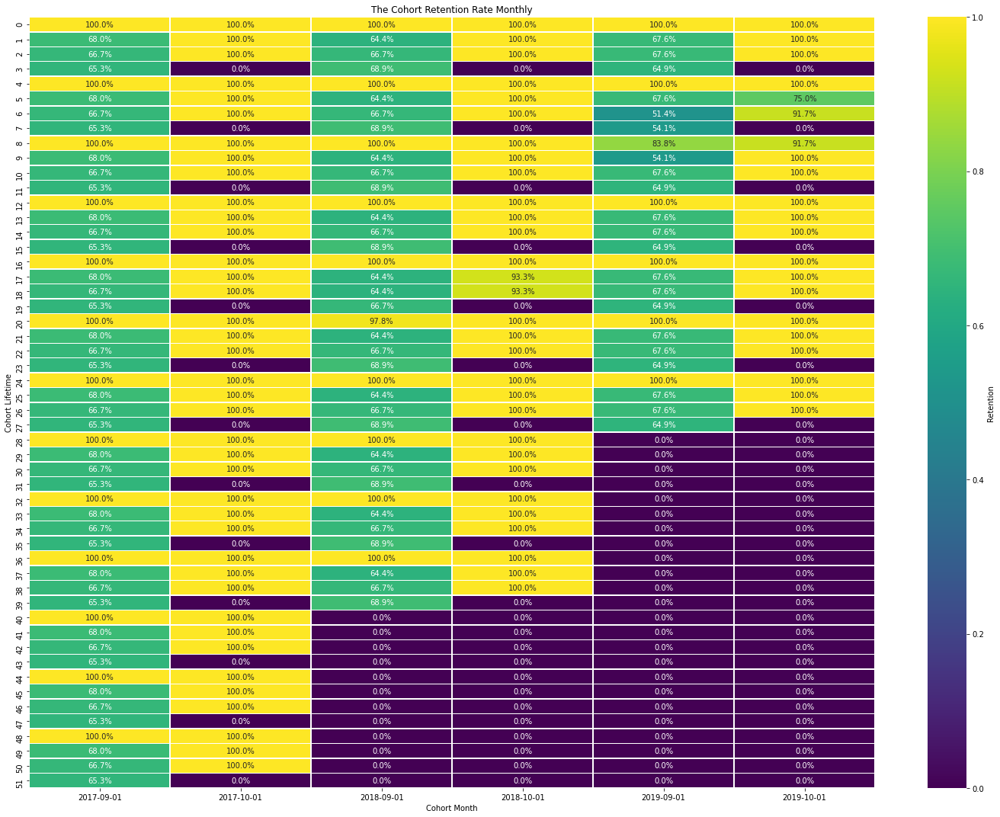

In [86]:
# converting the index to string for a nicer output
retention_pivot_monthly.index = retention_pivot_monthly.index.astype(str)

# converting all values to numeric
retention_pivot_monthly = retention_pivot_monthly.apply(pd.to_numeric) 

# creating a heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(retention_pivot_monthly.T, 
            cmap='viridis', 
            annot=True, 
            fmt=".1%", 
            cbar_kws={'label': 'Retention'},
            linewidths=0.5,)
plt.title('The Cohort Retention Rate Monthly')
plt.xlabel('Cohort Month')
plt.ylabel('Cohort Lifetime')
#plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('retention.png')
plt.show()

The cohort retention rate heatmap provides a visual representation of how well customers from different cohorts are retained over time. Here's how to interpret the graph:
* Each column represents a cohort's first interaction month. These are the months when customers made their initial purchases.
* Each row represents the number of months since the cohort's first interaction. It indicates how long customers from a specific cohort have been engaged with the company.
* The colors in the heatmap indicate the retention rate percentage. Darker colors represent lower retention rates, while lighter colors represent higher retention rates.
* The numbers within each cell indicate the percentage of customers from the cohort that made repeat purchases in the given lifetime month.

Interpretation: Start from the top left corner (the first interaction month of the first cohort) and move diagonally downward. We can observe how the retention rate changes as customers continue to interact with the company over their lifetime. Look for patterns such as consistent high retention (darker colors) or drops in retention (lighter colors).

Retention rates may vary from month to month within a cohort due to factors such as seasonal trends, promotions, new product releases, customer satisfaction levels, competition, and changing customer preferences. These influences can impact customer engagement and loyalty, resulting in fluctuations in retention rates over time.

In [87]:
# calculating the overall monthly retention rate
total_retention = cohorts['retention'].mean()
print('The overall monthly retention rate is {:.1%}'.format(total_retention))

The overall monthly retention rate is 85.2%


###### Retention rate per segment

In [88]:
# extracting first order date per customer segment
retention_by_region = retention_data.groupby(['customer_segment', 'customer_code'])['date'].min().reset_index()

# determining if each customer is retained or not
retention_by_region['is_retained'] = retention_by_region['date'] < retention_by_region['date'].max()

# calculating retention rates for each segment 
retention_by_region = round(retention_by_region.groupby('customer_segment')['is_retained'].mean() * 100, 2).reset_index()
#retention_by_region

In [89]:
# bar plot of retention rate per segment
fig_retention_by_region = px.bar(retention_by_region,
              x='customer_segment', 
              y='is_retained',)
# updating the layout of the plot
fig_retention_by_region.update_layout(title='Retention rate per segment',
                 title_x=0.5,)
# updating the x-axis
fig_retention_by_region.update_xaxes(showgrid=True,
                 title='Customer Segment',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True,)
                # tickvals=costs_per_source['source_id'].tolist())
# updating the y-axis
fig_retention_by_region.update_yaxes(showgrid=True,
                 title='Retention',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
fig_retention_by_region.show()

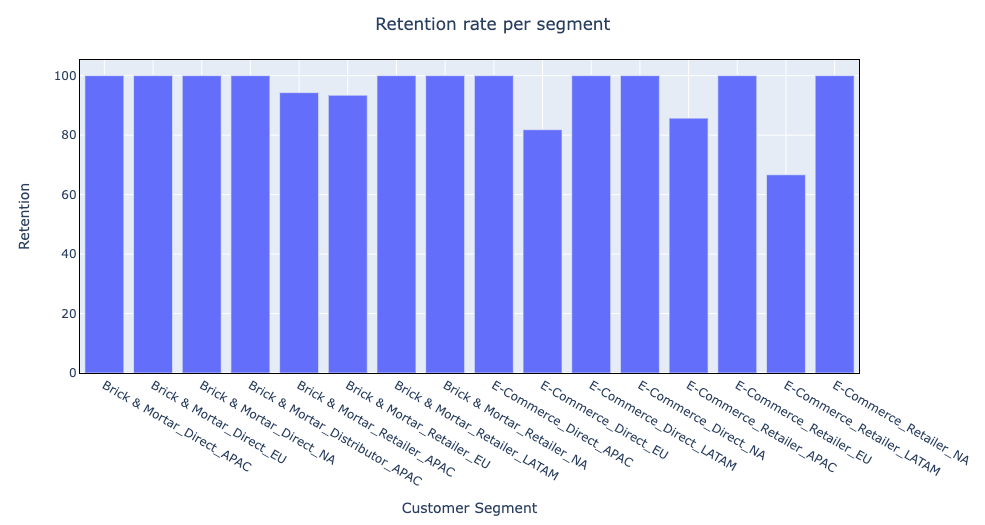

In [5]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot33.png")

##### Conclusions

* We conducted an analysis of monthly cohorts, including a total of six cohorts, starting either in September or October of the years 2017, 2018, and 2019. From the retention graph, we can see that each cohort displays a cyclical pattern over a four-month period.


* For the September cohorts, a clear pattern emerges: In every 4th month of the period, the retention rate is 100% (January, May and September). The 1st, 2nd, and 3rd months within each period exhibit consistent retention rates. An exception is observed in the September 2019 cohort, which displays a lower retention rate in the second period (March to June 2020).


* The October cohorts show a slightly different pattern: Retention rates are mostly 100% throughout the period. However, each January, May, and September, the retention rate drops to 0%. An exception is noted in the October 2018 cohort, with a retention rate of 93.3% in March and April 2020. The October 2019 cohort also displays lower retention rates from March to June.


* The decrease in retention rates from March to June 2020 can be attributed to external factors, specifically the COVID-19 pandemic and associated lockdown measures.


* The recurring 4-month pattern is probably a reflection of customer behavior and engagement within each cohort. Possible factors can be seasonality, economic conditions, market trends, or other external factors.


* The overall monthly retention rate of 85.2% can be considered relatively good, as it suggests that a significant portion of customers are continuing to engage with AtliQ Hardware's offerings over time. 


* Also, we conducted analysis of retention rates across different customer segments. Remarkably, 11 out of the 16 segments exhibit a perfect retention rate of 100%, indicating a high level of customer loyalty and engagement. The 'E-Commerce_Retailer_LATAM' segment exhibits the lowest retention rate of 66.67%.

#### 2.2.2 Compute churn rate to measure the percentage of customers who stop making purchases or leave AtliQ Hardware.

Examine customer churn rate using monthly cohort analysis. This method involves monitoring the number of customers who discontinue using a product over time. By organizing customers into cohorts and calculating those who disengage, we gain insights into customer attrition and the impact of our offerings.

###### Churn rate monthly cohort analysis

Churn rate monthly cohort analysis shows us the percentage of customers from a specific cohort who stop engaging and making purchases over time. It provides insights into customer attrition and dissatisfaction, indicating how well a business is retaining its customer base. A higher churn rate indicates that a larger proportion of customers from a particular cohort are leaving, suggesting issues with product quality, customer service, or value proposition. On the other hand, a lower churn rate suggests strong customer loyalty and positive experiences.

To compute the churn rate, we need to subtract the retention rate from 1. This gives us the percentage of customers who have churned (stopped engaging) within a specific lifetime month for each cohort. We've already formed cohorts and calculated the retention rate above. We will use that information.

In [90]:
# calculating the overall monthly churn rate
total_churn = 1 - total_retention
print('The overall monthly customer churn rate is {:.1%}'.format(total_churn))

The overall monthly customer churn rate is 14.8%


In [91]:
# calculating churn rate for each cohort age within each cohort
cohorts['churn_rate'] = (1 - cohorts['retention'])
#cohorts.head()

In [92]:
# building a pivot table, filling NaNs with 0
churn_pivot_monthly = cohorts.pivot_table(index='cohort_month',
                                      columns='cohort_lifetime',
                                      values='churn_rate',
                                      aggfunc='sum').fillna('0')
#retention_pivot_monthly

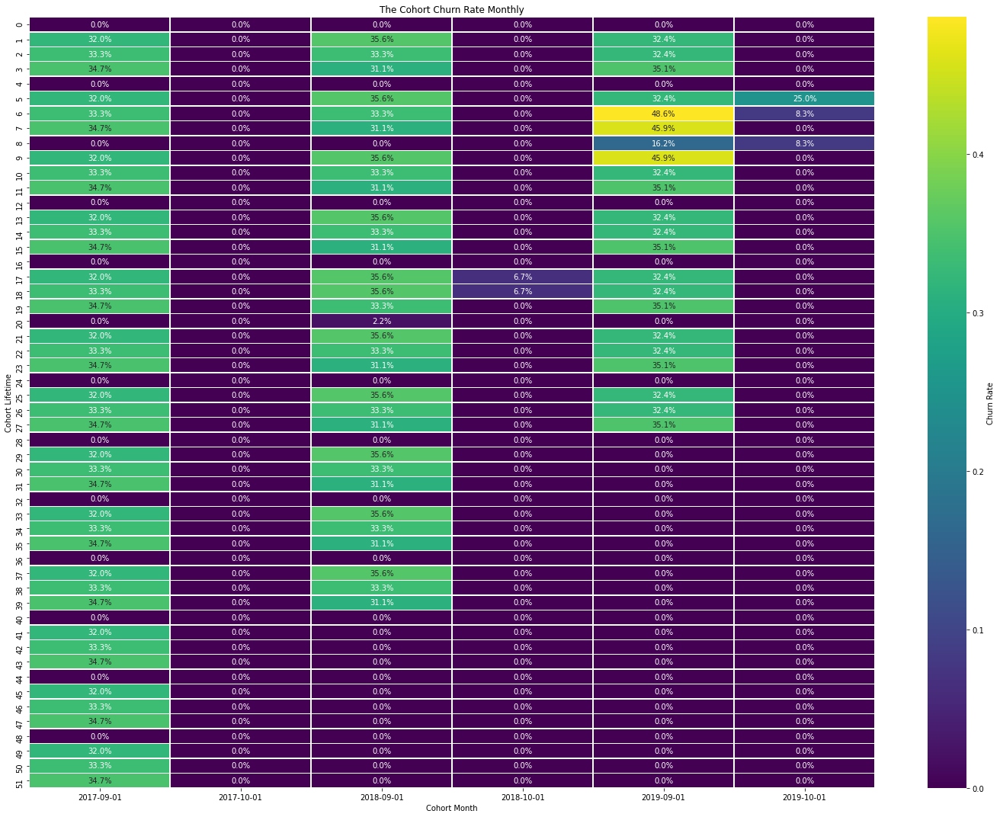

In [93]:
# converting the index to string for a nicer output
churn_pivot_monthly.index = churn_pivot_monthly.index.astype(str)

# converting all values to numeric, handling non-convertible values as NaN
churn_pivot_monthly = churn_pivot_monthly.apply(pd.to_numeric) #, errors='coerce')

# creating a heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(churn_pivot_monthly.T, 
            cmap='viridis', 
            annot=True, 
            fmt=".1%", 
            cbar_kws={'label': 'Churn Rate'},
            linewidths=0.5,)
plt.title('The Cohort Churn Rate Monthly')
plt.xlabel('Cohort Month')
plt.ylabel('Cohort Lifetime')
#plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The cohort churn rate heatmap provides a visual representation of how customers from different cohorts are churning over time. Here's how to interpret the graph:
* Each column represents a cohort's first interaction month. These are the months when customers made their initial purchases.
* Each row represents the number of months since the cohort's first interaction. It indicates how long customers from a specific cohort have been engaged with the company.
* The colors in the heatmap indicate the churn rate percentage. Darker colors represent lower churn rates, while lighter colors represent higher churn rates.
* The numbers within each cell indicate the percentage of customers from the cohort that have churned (stopped engaging) in the given lifetime month.

Interpretation: Start from the top left corner (the first interaction month of the first cohort) and move diagonally downward. We can observe how the churn rate changes as customers continue to interact with the company over their lifetime. Look for patterns such as consistent high churn (darker colors) or drops in churn (lighter colors).

Churn rates may vary from month to month within a cohort due to factors such as seasonal trends, promotions, customer dissatisfaction, competition, and changing customer preferences. 

##### Conclusions

* Churn rate mirrors the retention rate pattern, with zero churn every four months for September cohorts. Within each period, the 1st, 2nd, and 3rd months consistently display similar churn rates for September cohorts.


* The most significant churn rate spike occurs for the 2019-09-01 cohort during COVID-19 lockdown months (March, April, and June). Higher churn rates are also observed for the October cohorts of 2018 and 2019 during COVID months.


* The 2017-10-01 cohort maintains a consistent 0% churn rate throughout its lifetime.


* Overall, the monthly customer churn rate stands at 14.8%.

#### 2.2.3 Determine the average check (average transaction amount) to understand customer spending patterns

Explore average check trends using monthly cohort analysis. Grouping customers into cohorts, we calculate their average transaction amounts over time. This analysis sheds light on spending behavior, aiding in pricing strategy evaluation and customer satisfaction improvement.

In [94]:
total_sales_monthly.head()

,date,product_code,customer_code,fiscal_year,revenue
0,2017-09-01,A0118150101,70002017,2018,720.458412
1,2017-10-01,A0118150101,70002017,2018,762.838318
2,2017-11-01,A0118150101,70002017,2018,423.799066
3,2018-01-01,A0118150101,70002017,2018,197.772897
4,2018-02-01,A0118150101,70002017,2018,875.851402


In [95]:
# plotting a histogram of distribution of gross values
avg_check = px.histogram(total_sales_monthly,
                   x='revenue',)
# giving names to histogram and axes
avg_check.update_layout(title='Average Revenue From the Order',
                    title_x=0.5,
                    xaxis_title='Revenue',
                    yaxis_title='Frequency')
avg_check.show()

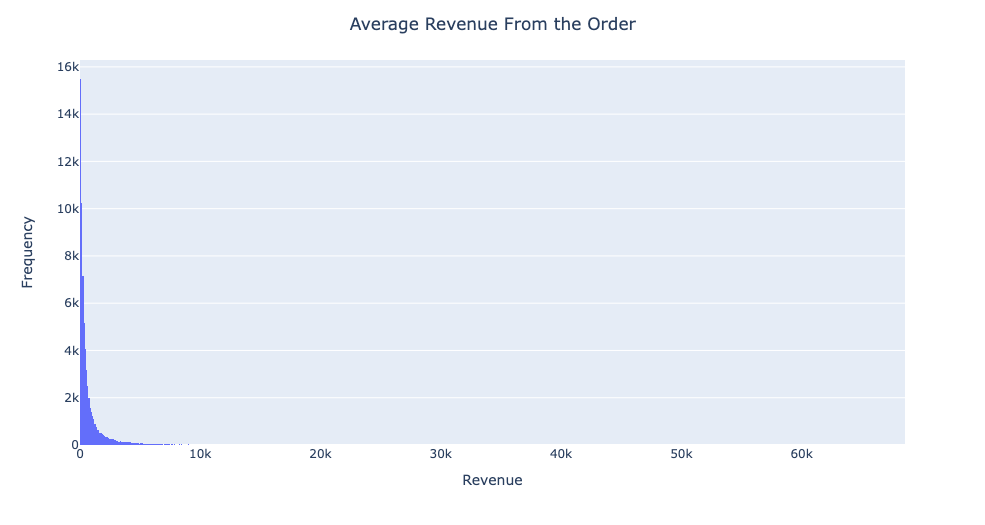

In [6]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot34.png")

In [96]:
# analysing invoice values
total_sales_monthly['revenue'].describe()

count    67178.000000
mean       987.114528
std       2609.300536
min          9.699701
25%        111.227430
50%        312.185739
75%        839.344902
max      68545.741067
Name: revenue, dtype: float64

As we can see from the graph above, that the distribution of invoice values per order is abnormal. We should perform cohort analysis.

###### Average check by each customer monthly cohort analysis

Average Check refers to the average amount of money spent by a customer in a single transaction or order. It is calculated by dividing the total revenue generated from orders by the total number of orders within a specific time period.

Average Check monthly cohort analysis provides insights into the spending behavior of customers within different cohorts over time. It helps businesses understand how the average order value changes as customers interact with the company. This analysis is valuable for assessing the effectiveness of pricing strategies, identifying patterns in customer spending, and optimizing revenue generation. To perform Average Check analysis we need to follow these steps: form cohorts based on their first order month, calculate cohort lifetimes - the number of months since each cohort's first interaction, calculate average check.

In [97]:
# retrieving the date of the first order for each customer
first_order_date_1 = total_sales_monthly.groupby('customer_code')['date'].min()

# renaming the column to avoid repetitions in column names
first_order_date_1.name = 'first_order_date' 

# adding date of the first session to 'total_sales_monthly' table 
average_check_data = total_sales_monthly.merge(first_order_date_1, on='customer_code')

# exrtracting first session month
average_check_data['cohort_month'] = average_check_data['first_order_date'].astype('datetime64[M]')

# calculating cohort lifetime
average_check_data['cohort_lifetime'] = (pd.to_datetime(average_check_data['date']) 
                                                 - pd.to_datetime(average_check_data['cohort_month']))

# converting the lifetime duration to months 
# storing the results to a new column 'cohort_lifetime'
average_check_data['cohort_lifetime'] = ((average_check_data['cohort_lifetime'] 
                                                  / np.timedelta64(1, 'M')).round().astype(int))

# checking the result
average_check_data.head()

,date,product_code,customer_code,fiscal_year,revenue,first_order_date,cohort_month,cohort_lifetime
0,2017-09-01,A0118150101,70002017,2018,720.458412,2017-09-01,2017-09-01,0
1,2017-10-01,A0118150101,70002017,2018,762.838318,2017-09-01,2017-09-01,1
2,2017-11-01,A0118150101,70002017,2018,423.799066,2017-09-01,2017-09-01,2
3,2018-01-01,A0118150101,70002017,2018,197.772897,2017-09-01,2017-09-01,4
4,2018-02-01,A0118150101,70002017,2018,875.851402,2017-09-01,2017-09-01,5


In [98]:
# calculating the numbers of customers at a certain lifetime for each cohort
avg_cohort = average_check_data.groupby(['cohort_month', 'cohort_lifetime']).agg({'revenue':'mean'}).reset_index()
# renaming the column
avg_cohort = avg_cohort.rename(columns = {'revenue':'avg_check'})
avg_cohort.head()

,cohort_month,cohort_lifetime,avg_check
0,2017-09-01,0,262.927570
1,2017-09-01,1,330.635159
2,2017-09-01,2,467.612566
3,2017-09-01,3,478.357953
4,2017-09-01,4,268.122444


In [99]:
# creating a pivot table with average check per customer for each cohort lifetime
avg_cohort_pivot = avg_cohort.pivot_table(index='cohort_month', 
                                         columns='cohort_lifetime', 
                                         values='avg_check', 
                                         aggfunc='mean')

# calculating the overall average check
total_revenue = avg_cohort_pivot.median(axis=0).median()
#total_revenue = avg_cohort['avg_check'].median()
print('The overall average monthly check per customer is: ', round(total_revenue, 2))

The overall average monthly check per customer is:  453.3


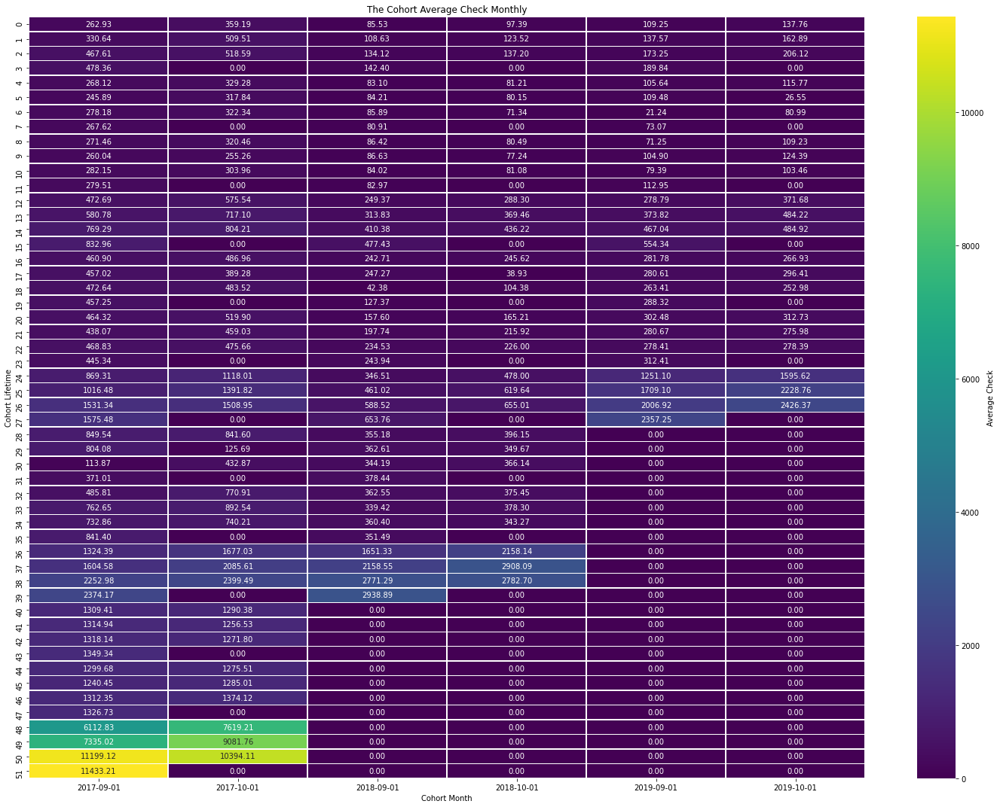

In [100]:
# rounding the values to 2 decimal places, replacing NaNs with empty strings
avg_cohort_pivot = avg_cohort_pivot.round(2).fillna('0')

# converting the values to numeric type
avg_cohort_pivot = avg_cohort_pivot.astype(float)
# converting the index to string for a nicer output
avg_cohort_pivot.index = avg_cohort_pivot.index.astype(str)
# plotting the heatmap of average check
plt.figure(figsize=(20, 15))
sns.heatmap(avg_cohort_pivot.T,
    annot=True,
    fmt='.2f',
    cmap='viridis',
    cbar_kws={'label': 'Average Check'},
    linewidths=0.5,)
# setting the title and axis labels
plt.title('The Cohort Average Check Monthly')
plt.xlabel('Cohort Month')
plt.ylabel('Cohort Lifetime')
plt.tight_layout()
plt.show()

The cohort average check heatmap represents average check values over time for different cohorts. Here's how to interpret the graph:
* Each column represents a cohort's first interaction month, indicating when customers made their initial purchases.
* Each row corresponds to the number of months since the cohort's first interaction, reflecting the duration of customer engagement.
* Colors in the heatmap represent average check values. Darker colors signify lower average order values, while lighter colors indicate higher values.
* The numbers within each cell display the Average Check amount for the cohort in the given lifetime month.

Interpretation: Start from the top left corner (the first interaction month of the first cohort) and move diagonally downward. Observe how the Average Check values change as customers interact with the company over their lifetime. Look for trends such as consistent increases (lighter colors) or fluctuations (varying colors) in spending behavior.

Fluctuations in Average Check values over time can result from factors like changes in customer preferences, product offerings, pricing strategies, or economic conditions.

###### Average check by customer segment over time

In [101]:
# merging tables
avg_check_overtime_data = total_sales_monthly.merge(dim_customer[['customer_segment', 'customer_code']], 
                                                    on='customer_code')
#avg_check_overtime_data

In [102]:
# calculating average check per segment and month
avg_check_overtime = avg_check_overtime_data.groupby(['customer_segment', 'date'])['revenue'].mean().reset_index()
avg_check_overtime.head()

,customer_segment,date,revenue
0,Brick & Mortar_Direct_APAC,2017-09-01,332.557415
1,Brick & Mortar_Direct_APAC,2017-10-01,467.263854
2,Brick & Mortar_Direct_APAC,2017-11-01,504.226270
3,Brick & Mortar_Direct_APAC,2017-12-01,920.864808
4,Brick & Mortar_Direct_APAC,2018-01-01,374.297983


In [103]:
# converting the index to string for a nicer output
avg_check_overtime.index = avg_check_overtime.index.astype(str)

# setting color palette so each segment has different color
custom_color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
                        '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#aec7e8', '#ffbb78',
                        '#98df8a', '#ff9896', '#c5b0d5', '#c49c94']

# line plot of costs per source over time
fig_avg_check_overtime = px.line(avg_check_overtime,
                             x='date', 
                             y='revenue',        
                             color='customer_segment',
                             color_discrete_sequence=custom_color_palette)
# updating the layout of the plot
fig_avg_check_overtime.update_layout(title='Average check by customer segment over time',
                 title_x=0.5,
                 legend_title='Customer Segment')
#                 plot_bgcolor='white')
# updating the x-axis
fig_avg_check_overtime.update_xaxes(showgrid=True,
                 title='Date',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
# updating the y-axis
fig_avg_check_overtime.update_yaxes(showgrid=True,
                 title='Average Check',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
fig_avg_check_overtime.show()

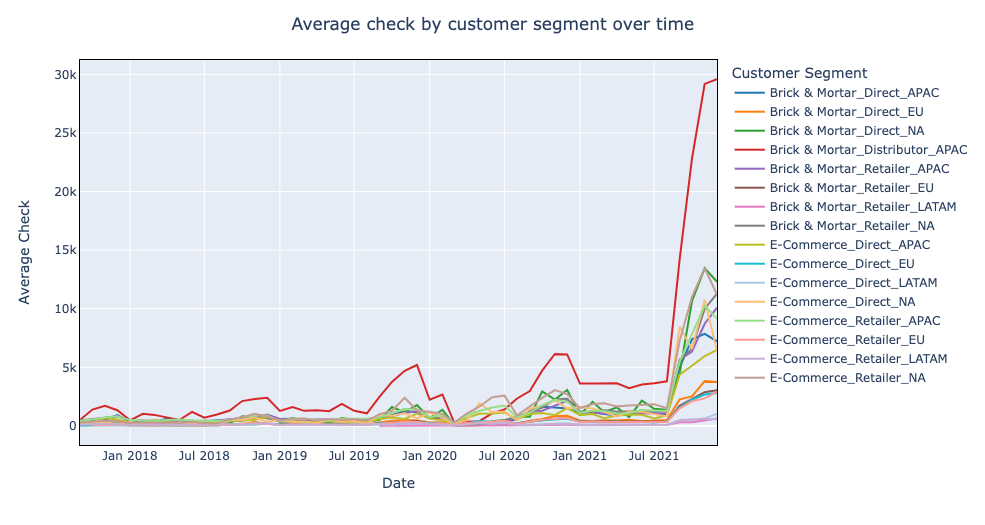

In [7]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot35.png")

##### Conclusions

* The average check consistently increases over the lifetime of each cohort, with the highest average check observed towards the end of the period. Notably, the 2017-09-01 cohort exhibits the largest average check, closely followed by the 2017-10-01 cohort. This pattern suggests a positive correlation between longer customer lifetimes and higher spending, potentially indicating that customers contribute more to the business over time. As a result, our key focus should be on cultivating long-term customer relationships for sustained revenue growth.


* Average checks for October cohorts show a recurring value of 0 every four months, aligned with a 0% retention rate during those periods. Furthermore, distinct spikes in average check are evident during holiday seasons in November and December (holiday time).


* Analyzing average check by segment reveals a gradual growth trend over time. A sharp rise is evident for all segments after August 2021, signifying a significant shift in purchasing behavior. That could be due to factors like economic recovery, changed consumer behavior, successful marketing campaigns, new products launching, and others. Notably, a drop in average check is observed in March 2020, attributed to the COVID-19 pandemic's impact. Similarly, spikes in average check are noted in November and December, suggesting heightened holiday-related spending.


* The segment with the highest average check consistently over time is 'Bricks&Mortal_Distributor_APAC', which is the only distributor among customer segments. Conversely, segments in the LATAM region display the lowest average check. That could be due to factors like economic challenges, currency fluctuations, regional preferences, product price strategy, and others.

#### 2.2.4 Determine  purchase frequency to understand customer spending patterns

Frequency Analysis helps businesses understand how often customers make purchases and whether these patterns change as they continue to interact with the company.

###### Purchase frequency by customer monthly cohort analysis

Frequency monthly cohort analysis examines the average number of orders made by customers within each cohort per month. This analysis provides insights into customer purchasing behavior and their engagement with the business over time.

To perform frequency analysis we need to follow these steps: form cohorts based on the first order month of each customer, calculate cohort lifetimes to track how long customers have been engaged with the company, and then compute the average frequency of orders.  To calculate how many orders do users make during a month, we need to divide the number of orders at a certain lifetime for each cohort by the number of users in the cohort.

In [104]:
retention_data_monthly.head()

,date,customer_code,fiscal_year,customer_segment,first_order_date,cohort_month,cohort_lifetime
0,2017-09-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,0
1,2017-10-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,1
2,2017-11-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,2
3,2018-01-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,4
4,2018-02-01,70002017,2018,Brick & Mortar_Direct_APAC,2017-09-01,2017-09-01,5


In [105]:
# calculating the number of unique customers
unique_customers_monthly = (retention_data_monthly.groupby(['cohort_month', 'cohort_lifetime'])
                                                  .agg({'customer_code':'nunique'}).reset_index())
# renaming the column
unique_customers_monthly = unique_customers_monthly.rename(columns = {'customer_code':'n_customers'})

# calculating number of orders
total_orders_monthly = (retention_data_monthly.groupby(['cohort_month', 'cohort_lifetime'])
                                              .agg({'customer_code':'count'}).reset_index())
# renaming the column
total_orders_monthly = total_orders_monthly.rename(columns = {'customer_code':'n_orders'})

# merging tables to have needed data in one column
orders_per_customer_monthly = (unique_customers_monthly.merge(total_orders_monthly, 
                                                             on=['cohort_month', 'cohort_lifetime']))

# calculating the number of orders per each customer segment and fiscal year
orders_per_customer_monthly['orders_per_customer'] = ((orders_per_customer_monthly['n_orders'] 
                                              / orders_per_customer_monthly['n_customers']).astype(int))
orders_per_customer_monthly.head()

,cohort_month,cohort_lifetime,n_customers,n_orders,orders_per_customer
0,2017-09-01,0,75,584,7
1,2017-09-01,1,51,402,7
2,2017-09-01,2,50,398,7
3,2017-09-01,3,49,391,7
4,2017-09-01,4,75,590,7


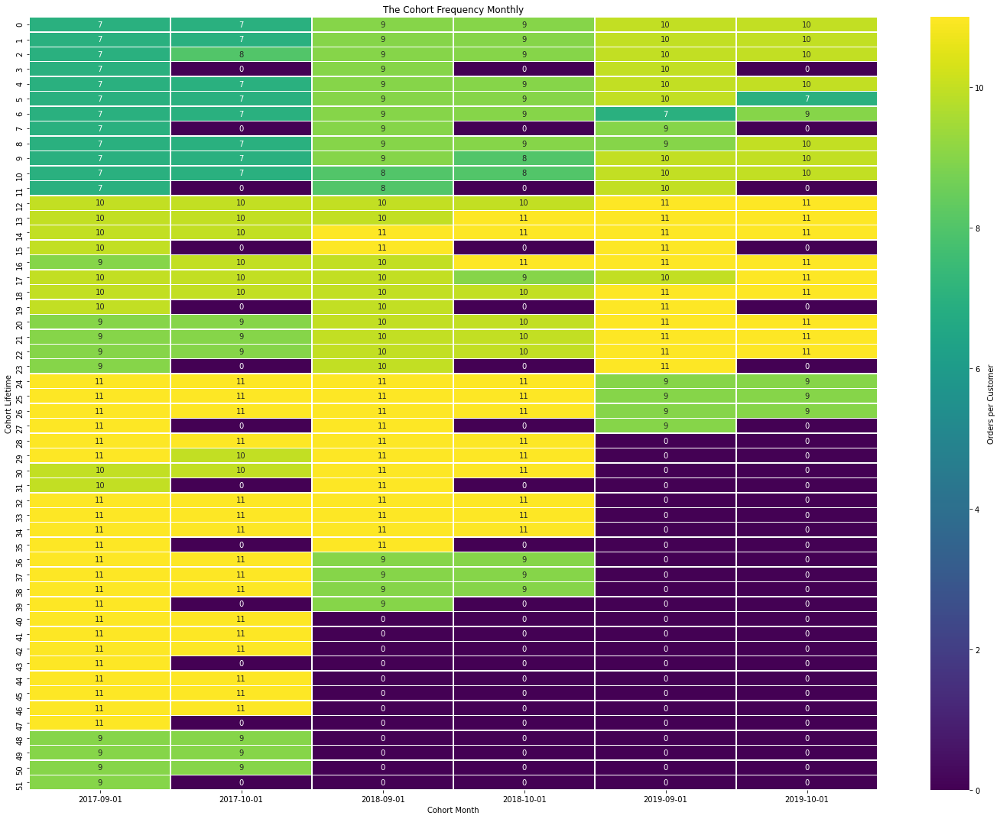

In [106]:
# creating a pivot table to reshape the data for visualization
orders_pivot_monthly = orders_per_customer_monthly.pivot(index='cohort_month', 
                                                         columns='cohort_lifetime', 
                                                         values='orders_per_customer').fillna(0)

# converting the index to string for a nicer output
orders_pivot_monthly.index = orders_pivot_monthly.index.astype(str)

# creating a heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(orders_pivot_monthly.T, 
            cmap='viridis', 
            annot=True, 
            cbar_kws={'label': 'Orders per Customer'},
            linewidths=0.5,
           )
plt.title('The Cohort Frequency Monthly')
plt.xlabel('Cohort Month')
plt.ylabel('Cohort Lifetime')
plt.tight_layout()
plt.show()

The cohort frequency heatmap illustrates the average order frequency values over time for different cohorts. Here's how to interpret the graph:
* Each column represents a cohort's first order month, indicating when customers made their initial purchases.
* Each row corresponds to the number of months since the cohort's first interaction, showing the duration of customer engagement.
* The colors in the heatmap reflect the average order frequency. Darker colors represent lower order frequency, while lighter colors indicate higher frequency.
* The numbers within each cell display the average number of orders made by the cohort in the given lifetime month.

Interpretation: Start from the top left corner (the first interaction month of the first cohort) and move diagonally downward. This allows you to observe how the average order frequency changes as customers interact with the company over their lifetime. Look for patterns like consistent increases (lighter colors) or fluctuations (varying colors) in order frequency.

Fluctuations in order frequency within a cohort can be influenced by factors such as marketing campaigns, product launches, seasonal changes, and customer preferences. 

###### Purchase frequency by customer per segment overtime

In [107]:
retention_data.head()

,date,customer_code,fiscal_year,customer_segment
0,2017-09-01,70002017,2018,Brick & Mortar_Direct_APAC
1,2017-10-01,70002017,2018,Brick & Mortar_Direct_APAC
2,2017-11-01,70002017,2018,Brick & Mortar_Direct_APAC
3,2018-01-01,70002017,2018,Brick & Mortar_Direct_APAC
4,2018-02-01,70002017,2018,Brick & Mortar_Direct_APAC


In [108]:
# calculating the number of unique customers 
unique_customers_overtime = (retention_data.groupby(['customer_segment', 'date'])['customer_code']
                                                                                           .nunique().reset_index())
# renaming columns
unique_customers_overtime = unique_customers_overtime.rename(columns = {'customer_code':'n_customers'})

# calculating the number of total orders 
total_orders_overtime = (retention_data.groupby(['customer_segment', 'date'])['customer_code']
                                                                                           .count().reset_index())
# renaming columns
total_orders_overtime = total_orders_overtime.rename(columns = {'customer_code':'n_orders'})

# merging tables to have needed data in one column
orders_per_customer_overtime = unique_customers_overtime.merge(total_orders_overtime, on=['customer_segment', 'date'])

# calculating the number of orders per each customer segment and month
orders_per_customer_overtime['orders_per_customer'] = ((orders_per_customer_overtime['n_orders'] 
                                              / orders_per_customer_overtime['n_customers']).astype(int))
orders_per_customer_overtime.head()

,customer_segment,date,n_customers,n_orders,orders_per_customer
0,Brick & Mortar_Direct_APAC,2017-09-01,5,40,8
1,Brick & Mortar_Direct_APAC,2017-10-01,5,40,8
2,Brick & Mortar_Direct_APAC,2017-11-01,4,32,8
3,Brick & Mortar_Direct_APAC,2017-12-01,1,8,8
4,Brick & Mortar_Direct_APAC,2018-01-01,5,40,8


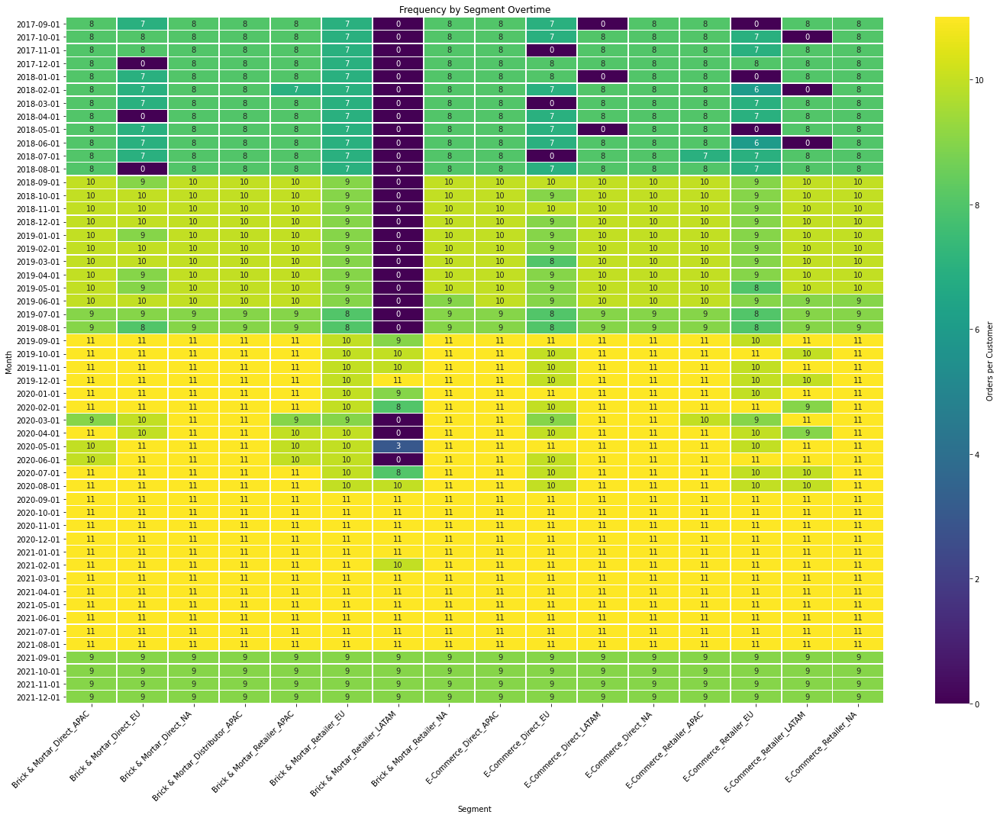

In [109]:
# changing 'date' column data type for nicer output
orders_per_customer_overtime['date'] = orders_per_customer_overtime['date'].astype(str)

# creating a pivot table to reshape the data for visualization
orders_pivot_overtime = orders_per_customer_overtime.pivot(index='customer_segment', columns='date', 
                                                           values='orders_per_customer').fillna(0)

# converting the index to string for a nicer output
orders_pivot_overtime.index = orders_pivot_overtime.index.astype(str)

# creating a heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(orders_pivot_overtime.T, 
            cmap='viridis', 
            annot=True, 
            cbar_kws={'label': 'Orders per Customer'},
            linewidths=0.5,
           )
plt.title('Frequency by Segment Overtime')
plt.xlabel('Segment')
plt.ylabel('Month')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

##### Conclusions

* The average number of orders per customer per cohort (order frequency) has been increasing year by year, reaching a peak of 11 orders. However, it dropped to 9 in 2022 fiscal year. Interestingly, as the average check increases over time, we might wonder if customers are buying more items in each order.


* We can see a yearly pattern, with the number of orders growing every fiscal year, except for 2022. Across all cohorts, the maximum number of orders remains 11. During the COVID-19 months, there's a decline in orders per customer in some customer segments, aligning with the pandemic's impact. For October cohorts, order frequency is 0 every four months, the same as retention rate.


* Looking at customer segments, a similar trend emerges. Order frequency grows over time but drops in 2022 fiscal year. Monthly orders align with fiscal years. There are dip during COVID-19 months for some segments and a slight decline in July and August 2019 for all segments. 'Brick&Mortal_Retailer_LATAM,' introduced in September 2019, experienced zero orders during the lockdown months and a minor recovery in May.

### 2.3 Customer Lifetime Value (LTV) and Customer Acquisition Cost (CAC)

#### 2.3.1 Customer Lifetime Value

Examine customer Lifetime Value to understand the long-term value of different customer segments. LTV guides strategic decisions to enhance profitability and nurture customer relationships for sustainable business growth.

Customer Lifetime Value (LTV) represents the total value a business can expect to generate from a customer over the entire duration of their relationship with the company. It takes into account all the revenue a customer is likely to bring in through repeated purchases, referrals, and other interactions. LTV is a critical metric for understanding the long-term profitability of acquiring and retaining customers. 

###### LTV Monthly Cohort Analysis

LTV monthly cohort analysis involves calculating the cumulative revenue generated by customers within each cohort over their entire engagement period. This analysis provides insights into the financial contribution of different cohorts and helps businesses prioritize customer segments for targeted marketing and retention efforts.

To compute LTV we need to divide the total revenue generated by each cohort over their lifetime by the number of initial customers in the cohort. For this analysis, we assume a margin rate of 1, so gross profit is equal to revenue.

We'll use the same cohorts we formed for the average check analysis. This way, we get a complete picture of how much different types of customers are worth to us. 

In [110]:
average_check_data.head()

,date,product_code,customer_code,fiscal_year,revenue,first_order_date,cohort_month,cohort_lifetime
0,2017-09-01,A0118150101,70002017,2018,720.458412,2017-09-01,2017-09-01,0
1,2017-10-01,A0118150101,70002017,2018,762.838318,2017-09-01,2017-09-01,1
2,2017-11-01,A0118150101,70002017,2018,423.799066,2017-09-01,2017-09-01,2
3,2018-01-01,A0118150101,70002017,2018,197.772897,2017-09-01,2017-09-01,4
4,2018-02-01,A0118150101,70002017,2018,875.851402,2017-09-01,2017-09-01,5


In [111]:
initial_customers_count

,cohort_month,n_customers_initial
0,2017-09-01,75
52,2017-10-01,25
91,2018-09-01,45
131,2018-10-01,15
161,2019-09-01,37
189,2019-10-01,12


In [112]:
# calculating the total revenue per cohort monthly
ltv_cohort = average_check_data.groupby(['cohort_month','date'])['revenue'].sum().reset_index()
# renaming columns
ltv_cohort.columns = ['cohort_month','order_month','revenue']
#ltv_cohort.head()

In [113]:
# merging 'ltv_cohort' table with the 'initial_users_count' table
ltv_cohort = ltv_cohort.merge(initial_customers_count ,on=['cohort_month'])
#ltv_cohort.head()

In [114]:
# calculating cohort lifetime in months
ltv_cohort['cohort_lifetime'] = ((ltv_cohort['order_month'] - 
                                    ltv_cohort['cohort_month']) / np.timedelta64(1,'M')).round().astype(int)
# calculating LTV
ltv_cohort['ltv'] = ltv_cohort['revenue'] / ltv_cohort['n_customers_initial']
ltv_cohort.head()

,cohort_month,order_month,revenue,n_customers_initial,cohort_lifetime,ltv
0,2017-09-01,2017-09-01,153549.701158,75,0,2047.329349
1,2017-09-01,2017-10-01,132915.333818,75,1,1772.204451
2,2017-09-01,2017-11-01,186109.801232,75,2,2481.464016
3,2017-09-01,2017-12-01,187037.959465,75,3,2493.839460
4,2017-09-01,2018-01-01,158192.241717,75,4,2109.229890


In [115]:
# creating a pivot_table with cumulative sum of LTV
ltv_cohort_pivot = ltv_cohort.pivot_table(index='cohort_month', 
                                      columns='cohort_lifetime', 
                                      values='ltv', 
                                      aggfunc='sum').cumsum(axis=0)

# calculating the overall LTV
total_ltv = ltv_cohort_pivot.median().median()
print('The overall LTV is: ', round(total_ltv, 2))

The overall LTV is:  12846.26


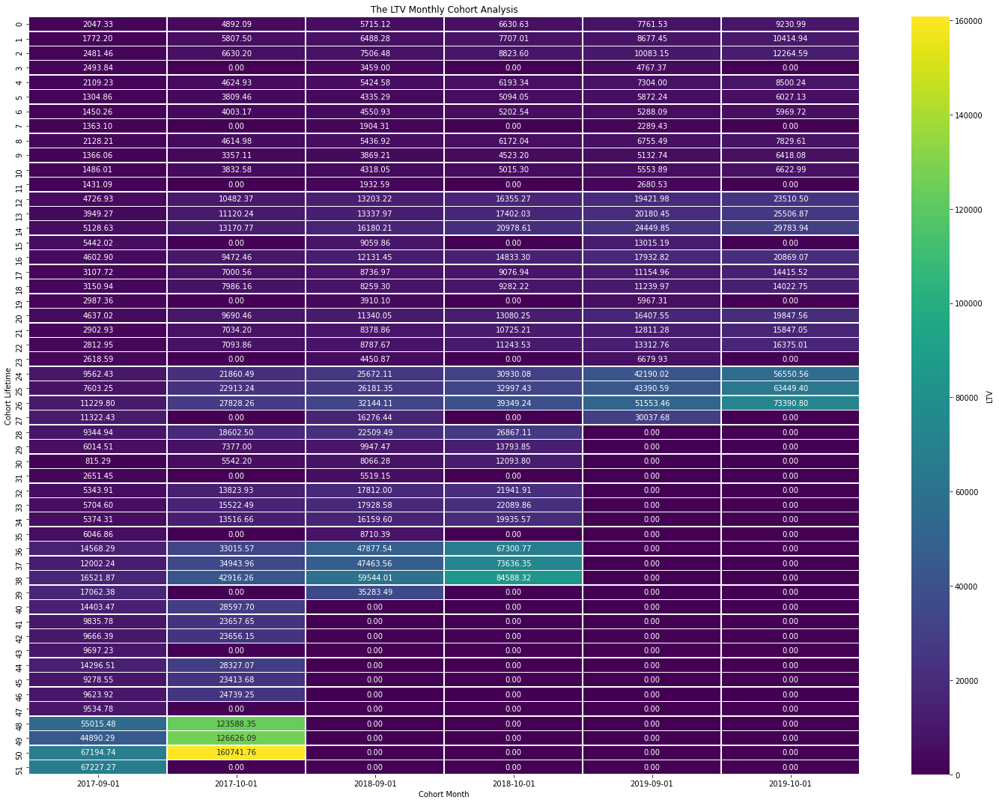

In [116]:
# rounding the values to 2 decimal places
ltv_cohort_pivot = ltv_cohort_pivot.round(2).fillna('0')

# converting the values to numeric type
ltv_cohort_pivot = ltv_cohort_pivot.astype(float)

# converting the index to string for a nicer output
ltv_cohort_pivot.index = ltv_cohort_pivot.index.astype(str)

# plotting the heatmap of cumulative sum of LTV
plt.figure(figsize=(20, 15))
sns.heatmap(ltv_cohort_pivot.T,
    annot=True,
    fmt='.2f',
    cmap='viridis',
    cbar_kws={'label': 'LTV'},
    linewidths=0.5)
# setting the title and axis labels
plt.title('The LTV Monthly Cohort Analysis')
plt.xlabel('Cohort Month')
plt.ylabel('Cohort Lifetime')
plt.tight_layout()
plt.savefig('LTV_cohort.png')
plt.show()

The LTV cohort heatmap provides a visual representation of the financial value contributed by customers from different cohorts over time. Here's how to interpret the graph:
* Each column represents a cohort's first interaction month. These are the months when customers initiated their initial transactions.
* Each row signifies the number of months since the cohort's inception. It indicates the duration of engagement for customers within a specific cohort.
* The colors within the heatmap convey LTV values. Darker shades indicate lower LTV values, while lighter shades represent higher LTV values.
* The numbers within each cell display the average Customer Lifetime Value for customers within that cohort during the given month.

Interpretation: start from the upper-left corner (the first interaction month of the first cohort) and move diagonally downward. This allows us to witness how the LTV changes as customers continue their interactions with the company throughout their engagement. Observe for patterns, such as consistently high LTV (depicted by lighter shades) or fluctuations in LTV (shown by darker shades).

It's possible to observe dips or spikes in LTV for certain cohorts at specific time points. These anomalies could be due to various factors such as marketing campaigns, seasonality, economic conditions, or changes in customer behavior.
LTV values may fluctuate monthly within a cohort due to various factors. These factors include shifts in customer behavior, economic influences, market dynamics, competitive activity, alterations in customer preferences, seasonality, delayed repeat purchases, and others. 

###### LTV per customer segment

In [117]:
average_check_data.head()

,date,product_code,customer_code,fiscal_year,revenue,first_order_date,cohort_month,cohort_lifetime
0,2017-09-01,A0118150101,70002017,2018,720.458412,2017-09-01,2017-09-01,0
1,2017-10-01,A0118150101,70002017,2018,762.838318,2017-09-01,2017-09-01,1
2,2017-11-01,A0118150101,70002017,2018,423.799066,2017-09-01,2017-09-01,2
3,2018-01-01,A0118150101,70002017,2018,197.772897,2017-09-01,2017-09-01,4
4,2018-02-01,A0118150101,70002017,2018,875.851402,2017-09-01,2017-09-01,5


In [118]:
total_sales_monthly.head()

,date,product_code,customer_code,fiscal_year,revenue
0,2017-09-01,A0118150101,70002017,2018,720.458412
1,2017-10-01,A0118150101,70002017,2018,762.838318
2,2017-11-01,A0118150101,70002017,2018,423.799066
3,2018-01-01,A0118150101,70002017,2018,197.772897
4,2018-02-01,A0118150101,70002017,2018,875.851402


In [119]:
# adding 'customer_segment' column to 'total_sales_monthly' table
ltv_per_segment_data = total_sales_monthly.merge(dim_customer[['customer_code', 'customer_segment']],
                                                                                         on = 'customer_code')
#ltv_per_segment_data.head()

In [120]:
# calculating he number of customers per segment and revenue per segment
ltv_per_segment = ltv_per_segment_data.groupby('customer_segment').agg({'customer_code':'nunique',
                                                                        'revenue':'sum'}).round(2).reset_index()
# renaming columns
ltv_per_segment.columns = ['customer_segment','n_customers','revenue']

# calculating LTV per segment
ltv_per_segment['ltv'] = round(ltv_per_segment['revenue'] / ltv_per_segment['n_customers'], 2)

ltv_per_segment.head()

,customer_segment,n_customers,revenue,ltv
0,Brick & Mortar_Direct_APAC,8,3302536.34,412817.04
1,Brick & Mortar_Direct_EU,6,1024426.35,170737.72
2,Brick & Mortar_Direct_NA,2,1229122.97,614561.48
3,Brick & Mortar_Distributor_APAC,5,7462837.03,1492567.41
4,Brick & Mortar_Retailer_APAC,35,15625589.67,446445.42


In [121]:
# plotting bar graph of LTV per sourse
fig_ltv_segment = px.bar(ltv_per_segment,
                   x='customer_segment',
                   y='ltv')
# giving names  and axes
fig_ltv_segment.update_layout(title='LTV per Segment',
                    title_x=0.5,
                    xaxis_title='Segment',
                    yaxis_title='LTV')
# setting x-axis range
fig_ltv_segment.update_xaxes(type='category')
fig_ltv_segment.show()

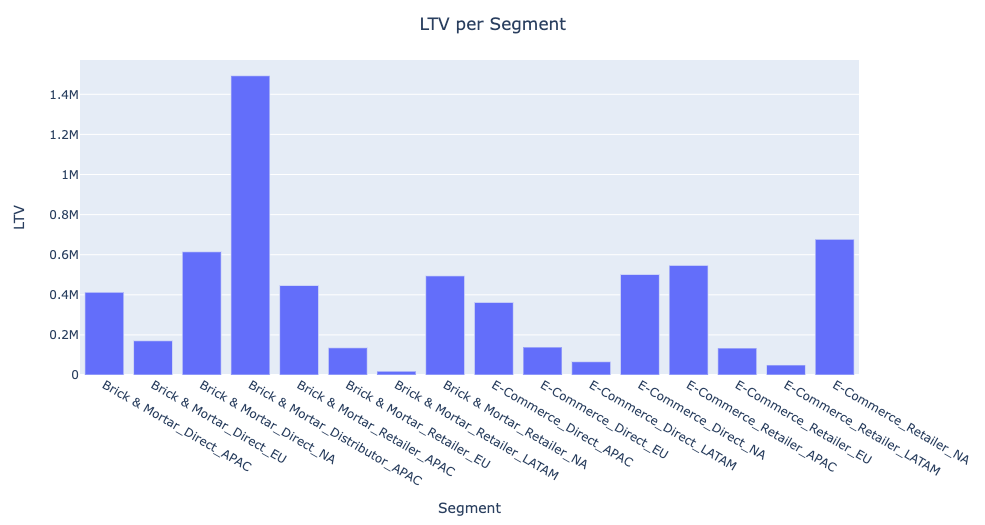

In [8]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot36.png")

###### LTV per segment monthly

In [122]:
# calculating the number of customers per segment per segment and revenue monthly
ltv_per_segment_monthly = ltv_per_segment_data.groupby(['date', 'customer_segment']).agg({'customer_code':'nunique', 
                                                                                     'revenue':'sum'}).reset_index()
# renaming columns
ltv_per_segment_monthly = ltv_per_segment_monthly.rename(columns={'customer_code':'n_customers'})
                                                               
# calculating LTV per segment
ltv_per_segment_monthly['ltv']=ltv_per_segment_monthly['revenue'] / ltv_per_segment_monthly['n_customers']
ltv_per_segment_monthly.head()

,date,customer_segment,n_customers,revenue,ltv
0,2017-09-01,Brick & Mortar_Direct_APAC,5,13302.296601,2660.459320
1,2017-09-01,Brick & Mortar_Direct_EU,3,1818.055742,606.018581
2,2017-09-01,Brick & Mortar_Direct_NA,1,409.153894,409.153894
3,2017-09-01,Brick & Mortar_Distributor_APAC,4,16018.717129,4004.679282
4,2017-09-01,Brick & Mortar_Retailer_APAC,15,55722.168751,3714.811250


In [123]:
# setting color palette so each segment has different color
custom_color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
                        '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#aec7e8', '#ffbb78',
                        '#98df8a', '#ff9896', '#c5b0d5', '#c49c94']

# line plot of monthly LTV per source
fig_ltv_per_segment_monthly = px.line(ltv_per_segment_monthly,
              x='date', 
              y='ltv',
              color='customer_segment',
              color_discrete_sequence=custom_color_palette)
# updating the layout of the plot
fig_ltv_per_segment_monthly.update_layout(title='LTV per Segment Monthly',
                 title_x=0.5,
                 legend_title='Segment')
# updating the x-axis
fig_ltv_per_segment_monthly.update_xaxes(showgrid=True,
                 title='Month',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True,)
# updating the y-axis
fig_ltv_per_segment_monthly.update_yaxes(showgrid=True,
                 title='LTV',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
fig_ltv_per_segment_monthly.show()

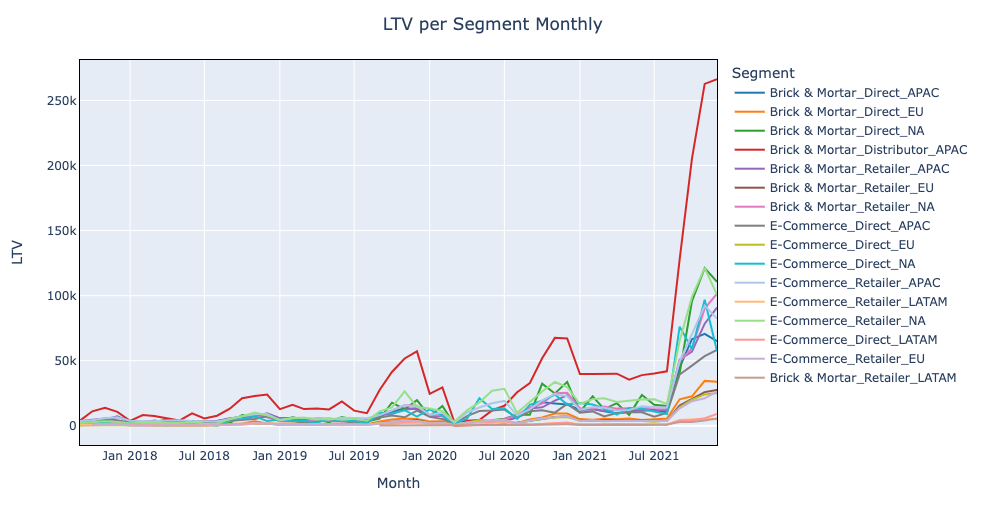

In [9]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot37.png")

##### Conclusions 

* The customer Lifetime Value (LTV) demonstrates a positive trend over time within each cohort, indicating consistent ordering behavior among customers, contributing to the overall increase in LTV. However, the 2018 and 2019 September cohorts exhibit a decline in LTV during their final months of the lifetime period.


* The 2017 October cohort stands out with the highest overall LTV performance. This implies that customers acquired during this period exhibit a stronger inclination towards repeat purchases, sustained spending, and higher revenue generation for the business.


* LTV rises in the initial months for each new cohort, with the 2019-10-01 cohort displaying the highest initial LTV. This observation could suggest that customers acquired in the October cohort tend to generate substantial early revenue. This could be attributed to targeted marketing strategies or promotions aimed at attracting high-value customers.


* For October cohorts, LTV experiences periodic drops every 4 months, mirroring the patterns observed in retention and average check metrics. Customers in October cohorts display higher initial-month LTV compared to September cohorts.


* The segment 'Brick%Mortal_Distributor_APAC' shows the highest overall LTV, while LATAM region segments, especially 'Brick%Mortal_Retailer_LATAM', exhibit the lowest LTV figures.


* Analyzing LTV per customer segment on a monthly basis reveals similar trends as the average check per segment graph. Notably, there are drops for all segments in March 2020, attributed to the impact of COVID-19. After August 2021, there is a sharp rise in LTV across most segments, possibly indicating shifts in customer spending behavior. Spikes in November and December for mosr segments suggest increased engagement during holiday periods.

* The overall LTV is $12846.26

#### 2.3.2 Customer Acquisition Cost 

Customer Acquisition Cost (CAC) represents the total cost a business incurs to acquire a new customer. It includes all expenses related to marketing, advertising, sales efforts, and other activities aimed at attracting and converting potential customers into paying ones. Calculating CAC helps businesses assess the efficiency and effectiveness of their customer acquisition strategies and make informed decisions about resource allocation and marketing budgets. To calculate CAC we need to divide total costs by number of buyers.

We will determine Customer Acquisition Cost using manufacturing costs. This provides insights into the expenses of acquiring new customers, aiding our decision-making for effective resource allocation and maximizing returns.

In [124]:
total_manufacturing_costs.head()

,date,product_code,customer_code,fiscal_year,order_manufacturing_cost
0,2018-01-01,A0118150101,70002017,2018,64.666
1,2018-01-01,A0118150101,70002018,2018,78.523
2,2018-01-01,A0118150101,70003181,2018,73.904
3,2018-01-01,A0118150101,70003182,2018,36.952
4,2018-01-01,A0118150101,70006157,2018,9.238


In [125]:
# calculating total monthly costs and customers per month
cac_data = total_manufacturing_costs.groupby('date').agg({'order_manufacturing_cost':'sum',
                                              'customer_code':'nunique'}).reset_index()
# renaming the columns
cac_data.columns = ['date','order_manufacturing_cost', 'n_customers']
cac_data.head()

,date,order_manufacturing_cost,n_customers
0,2018-01-01,61910.3780,75
1,2018-02-01,61546.8693,76
2,2018-03-01,66595.6921,75
3,2018-04-01,65155.5548,74
4,2018-05-01,62521.4483,75


In [126]:
# calculating CAC per month
cac_data['cac'] = cac_data['order_manufacturing_cost'] / cac_data['n_customers']
cac_data.head()

,date,order_manufacturing_cost,n_customers,cac
0,2018-01-01,61910.3780,75,825.471707
1,2018-02-01,61546.8693,76,809.827228
2,2018-03-01,66595.6921,75,887.942561
3,2018-04-01,65155.5548,74,880.480470
4,2018-05-01,62521.4483,75,833.619311


In [127]:
# line plot of overall CAC
fig_cac_month = px.line(cac_data,
              x='date', 
              y='cac')
# updating the layout of the plot
fig_cac_month.update_layout(title=' Overall CAC',
                 title_x=0.5,)
#                 plot_bgcolor='white')
# updating the x-axis
fig_cac_month.update_xaxes(showgrid=True,
                 title='Month',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
# updating the y-axis
fig_cac_month.update_yaxes(showgrid=True,
                 title='CAC',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
fig_cac_month.show()

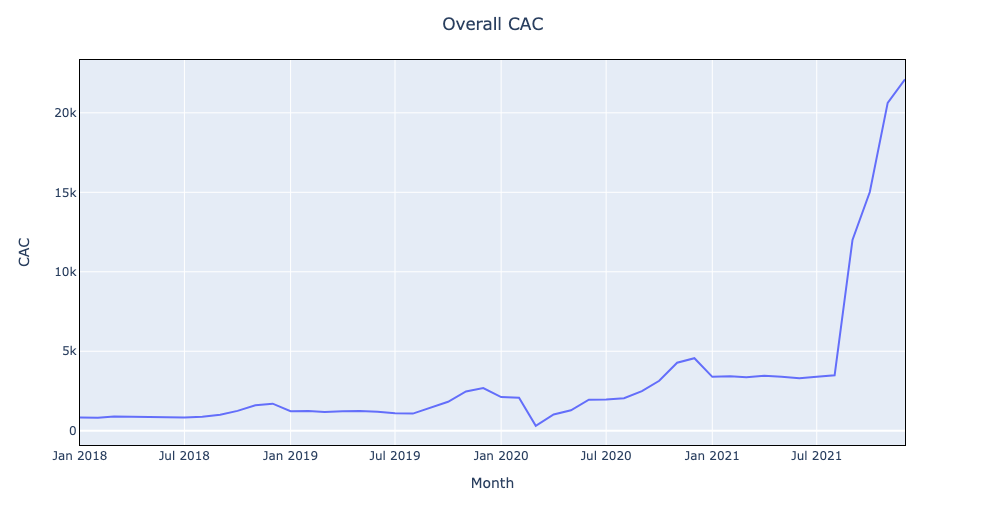

In [10]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot38.png")

In [128]:
# calculating overall average CAC
total_cac = cac_data['cac'].median()
print('The overall average CAC is: ', round(total_cac, 2))

The overall average CAC is:  1762.97


###### CAC per customer segment monthly

In [129]:
total_manufacturing_costs.head()

,date,product_code,customer_code,fiscal_year,order_manufacturing_cost
0,2018-01-01,A0118150101,70002017,2018,64.666
1,2018-01-01,A0118150101,70002018,2018,78.523
2,2018-01-01,A0118150101,70003181,2018,73.904
3,2018-01-01,A0118150101,70003182,2018,36.952
4,2018-01-01,A0118150101,70006157,2018,9.238


In [130]:
# adding 'customer_segment' column to 'total_manufacturing_costs' table
cac_per_segment_monthly_data = total_manufacturing_costs.merge(dim_customer[['customer_segment', 'customer_code']],
                                                               on='customer_code')
cac_per_segment_monthly_data.head()

,date,product_code,customer_code,fiscal_year,order_manufacturing_cost,customer_segment
0,2018-01-01,A0118150101,70002017,2018,64.666,Brick & Mortar_Direct_APAC
1,2018-02-01,A0118150101,70002017,2018,286.378,Brick & Mortar_Direct_APAC
2,2018-03-01,A0118150101,70002017,2018,277.140,Brick & Mortar_Direct_APAC
3,2018-05-01,A0118150101,70002017,2018,244.807,Brick & Mortar_Direct_APAC
4,2018-06-01,A0118150101,70002017,2018,258.664,Brick & Mortar_Direct_APAC


In [131]:
# calculating the number of customers monthly per segment and total costs per segment monthly
cac_per_segment_monthly = (cac_per_segment_monthly_data.groupby(['date','customer_segment'])
                                                       .agg({'customer_code':'nunique',
                                                             'order_manufacturing_cost':'sum'}).reset_index())
# renaming the columns
cac_per_segment_monthly.columns = ['date','customer_segment','n_customers', 'order_manufacturing_cost']
#cac_segment_data.head()

In [132]:
# calculating CAC per month per each segment
cac_per_segment_monthly['cac'] = round(cac_per_segment_monthly['order_manufacturing_cost'] 
                                       / cac_per_segment_monthly['n_customers'], 2)
cac_per_segment_monthly.head()

,date,customer_segment,n_customers,order_manufacturing_cost,cac
0,2018-01-01,Brick & Mortar_Direct_APAC,5,4818.9734,963.79
1,2018-01-01,Brick & Mortar_Direct_EU,3,548.8090,182.94
2,2018-01-01,Brick & Mortar_Direct_NA,1,137.1867,137.19
3,2018-01-01,Brick & Mortar_Distributor_APAC,4,6432.9107,1608.23
4,2018-01-01,Brick & Mortar_Retailer_APAC,15,22988.9421,1532.60


In [133]:
# setting color palette
custom_color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
                        '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#aec7e8', '#ffbb78',
                        '#98df8a', '#ff9896', '#c5b0d5', '#c49c94']

# line plot of monthly CAC per segment
fig_cac_month_source = px.line(cac_per_segment_monthly,
              x='date', 
              y='cac',
              color='customer_segment',
              color_discrete_sequence=custom_color_palette)
# updating the layout of the plot
fig_cac_month_source.update_layout(title='Monthly CAC per Segment',
                 title_x=0.5,
                 legend_title='Segment')
#                 plot_bgcolor='white')
# updating the x-axis
fig_cac_month_source.update_xaxes(showgrid=True,
                 title='Month',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
# updating the y-axis
fig_cac_month_source.update_yaxes(showgrid=True,
                 title='CAC',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
fig_cac_month_source.show()

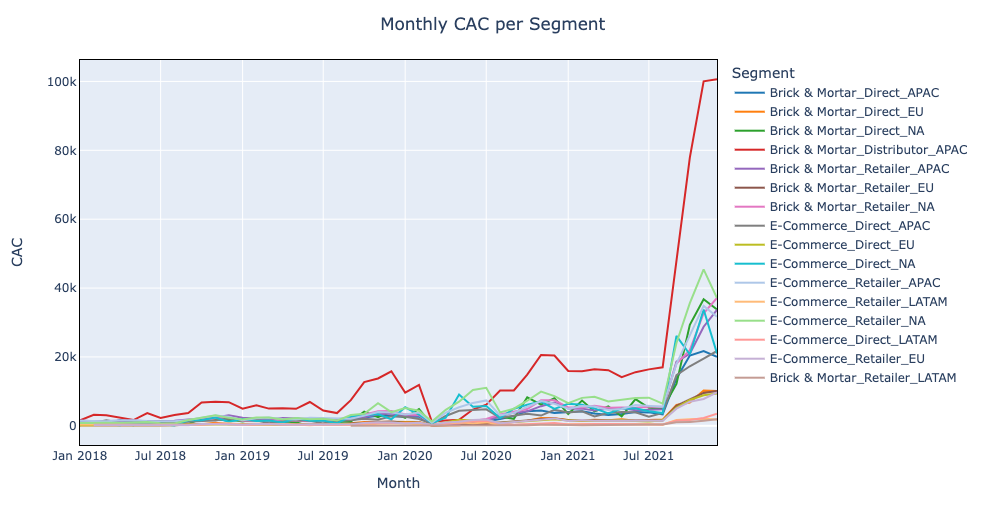

In [11]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot39.png")

###### CAC per customer segment overall

In [134]:
cac_per_segment_monthly_data.head()

,date,product_code,customer_code,fiscal_year,order_manufacturing_cost,customer_segment
0,2018-01-01,A0118150101,70002017,2018,64.666,Brick & Mortar_Direct_APAC
1,2018-02-01,A0118150101,70002017,2018,286.378,Brick & Mortar_Direct_APAC
2,2018-03-01,A0118150101,70002017,2018,277.140,Brick & Mortar_Direct_APAC
3,2018-05-01,A0118150101,70002017,2018,244.807,Brick & Mortar_Direct_APAC
4,2018-06-01,A0118150101,70002017,2018,258.664,Brick & Mortar_Direct_APAC


In [135]:
# calculating the number of customers per segment and manufacturing costs per segment
cac_per_segment = (cac_per_segment_monthly_data.groupby(['customer_segment']).agg({'customer_code':'nunique',
                                                                                    'order_manufacturing_cost':'sum'})
                                                                                   .round(2)
                                                                                   .reset_index())
# renaming the columns
cac_per_segment.columns = ['customer_segment','n_customers', 'costs']

# calculating CAC per source
cac_per_segment['cac'] = round(cac_per_segment['costs'] / cac_per_segment['n_customers'], 2)
cac_per_segment.head()

,customer_segment,n_customers,costs,cac
0,Brick & Mortar_Direct_APAC,8,960271.16,120033.90
1,Brick & Mortar_Direct_EU,6,297443.09,49573.85
2,Brick & Mortar_Direct_NA,2,355308.45,177654.22
3,Brick & Mortar_Distributor_APAC,5,2655834.16,531166.83
4,Brick & Mortar_Retailer_APAC,35,5485319.24,156723.41


In [136]:
# bar plot of CAC per segment
fig_cac_per_segment = px.bar(cac_per_segment,
              x='customer_segment', 
              y='cac',)
# updating the layout of the plot
fig_cac_per_segment.update_layout(title='CAC per Segment',
                 title_x=0.5,)
# updating the x-axis
fig_cac_per_segment.update_xaxes(showgrid=True,
                 title='Segment',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True,)
                # tickvals=costs_per_source['source_id'].tolist())
# updating the y-axis
fig_cac_per_segment.update_yaxes(showgrid=True,
                 title='CAC',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
fig_cac_per_segment.show()

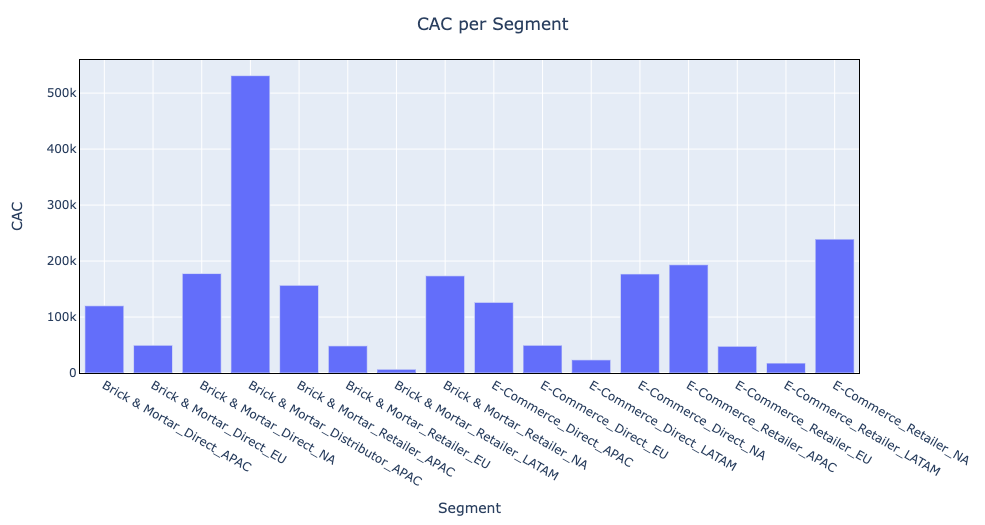

In [12]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot40.png")

##### Conclusions

* The 'Brick%Mortal_Distributor_APAC' segment demonstrates the highest CAC, aligning with the trend in LTV. LATAM region segments display the lowest CAC, mirroring their LTV pattern.


* The overall CAC graph mirrors the LTV trend, particularly seen in the LTV of the 'Brick%Mortal_Distributor_APAC' segment with a drop in March 2020, followed by spikes in November-December and a sharp rise after August 2021.


* The average CAC across all segments is $1762.97.


* Monthly CAC per segment follows the LTV per segment trend.


* Comparing the average CAC of \\$1762.97 to the total LTV of \\$12846.26 suggests that, on average, the value generated from each customer over their entire lifecycle is significantly higher than the costs incurred to attract that customer. This indicates a positive relationship between customer acquisition and long-term value, which is a promising sign of a company's profitability and growth potential.

#### 2.3.3 Return on Investments (ROI)

Calculate ROI (Return on Investment) to assess the effectiveness of customer acquisition. 

ROI used to measure the profitability of an investment relative to its cost. ROI is calculated by dividing the net profit (LTV) by the initial cost of the investment(CAC). A positive ROI indicates that the investment has generated more profit than it cost, while a negative ROI suggests that the investment has resulted in a loss.

###### ROI per cohort.

In [137]:
cac_data.head()

,date,order_manufacturing_cost,n_customers,cac
0,2018-01-01,61910.3780,75,825.471707
1,2018-02-01,61546.8693,76,809.827228
2,2018-03-01,66595.6921,75,887.942561
3,2018-04-01,65155.5548,74,880.480470
4,2018-05-01,62521.4483,75,833.619311


In [138]:
ltv_cohort.head()

,cohort_month,order_month,revenue,n_customers_initial,cohort_lifetime,ltv
0,2017-09-01,2017-09-01,153549.701158,75,0,2047.329349
1,2017-09-01,2017-10-01,132915.333818,75,1,1772.204451
2,2017-09-01,2017-11-01,186109.801232,75,2,2481.464016
3,2017-09-01,2017-12-01,187037.959465,75,3,2493.839460
4,2017-09-01,2018-01-01,158192.241717,75,4,2109.229890


In [139]:
# merging tables to extract needed data
roi = (ltv_cohort[['cohort_month', 'cohort_lifetime', 'order_month', 'ltv']]
                     .merge(cac_data[['date', 'cac']], left_on='order_month', right_on='date'))

# calculating ROI
roi['roi'] = roi['ltv'] / roi['cac']
roi.head()

,cohort_month,cohort_lifetime,order_month,ltv,date,cac,roi
0,2017-09-01,4,2018-01-01,2109.229890,2018-01-01,825.471707,2.555181
1,2017-09-01,5,2018-02-01,1304.858267,2018-02-01,809.827228,1.611280
2,2017-10-01,4,2018-02-01,2515.704031,2018-02-01,809.827228,3.106470
3,2017-09-01,6,2018-03-01,1450.256302,2018-03-01,887.942561,1.633277
4,2017-10-01,5,2018-03-01,2504.600866,2018-03-01,887.942561,2.820679


In [140]:
# creating pivot table with ROI
roi_pivot = roi.pivot_table(index='cohort_month', 
                            columns='cohort_lifetime', 
                            values='roi', 
                            aggfunc='mean').cumsum(axis=1).round(2) 
roi_pivot = roi_pivot.fillna('0')

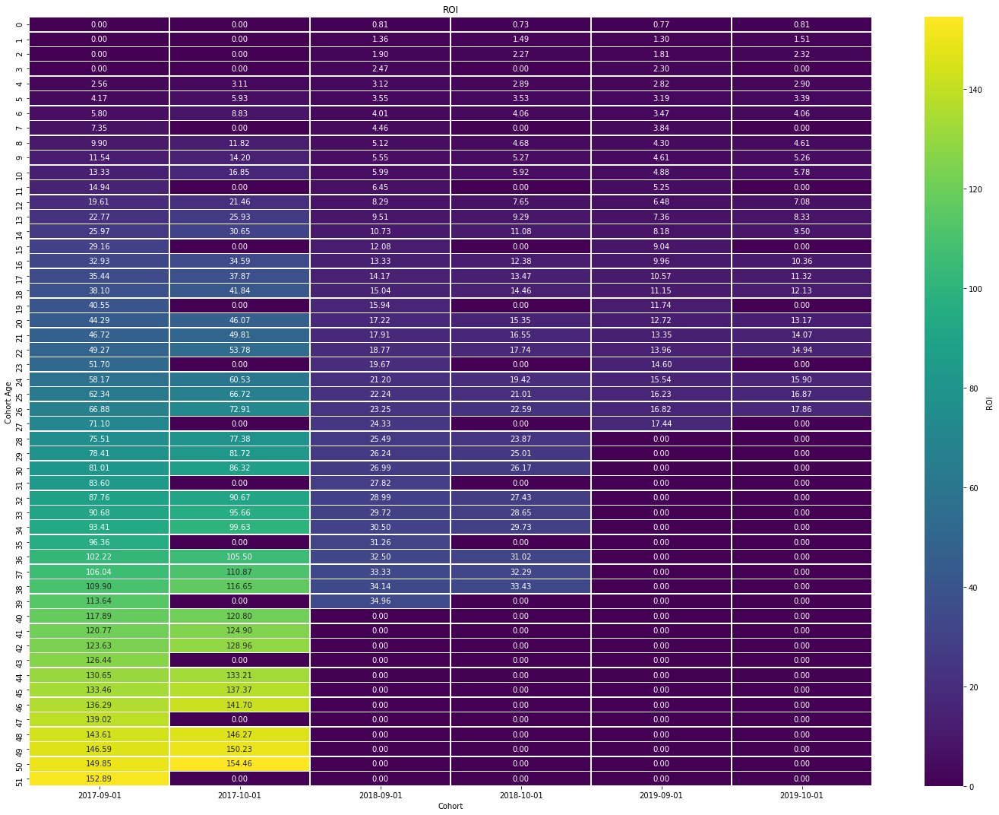

In [141]:
# converting the values to numeric type
roi_pivot = roi_pivot.astype(float)

# converting the index to string for a nicer output
roi_pivot.index = roi_pivot.index.astype(str)

# plotting the heatmap of cumulative sum of LTV
plt.figure(figsize=(20, 15))
sns.heatmap(roi_pivot.T,
    annot=True,
    fmt='.2f',
    cmap='viridis',
    cbar_kws={'label': 'ROI'},
    linewidths=0.5)
# setting the title and axis labels
plt.title('ROI')
plt.xlabel('Cohort')
plt.ylabel('Cohort Age')
plt.tight_layout()
plt.show()

The ROI cohort heatmap provides a visual representation of the return on investment achieved by customers from different cohorts over time. Here's how to understand the graph:
* Each column represents a cohort's first interaction month. These are the months when customers initiated their initial transactions.
* Each row signifies the number of months since the cohort's inception. It indicates the duration of engagement for customers within a specific cohort.
* The colors within the heatmap indicate the return on investment (ROI) values for each cohort. Darker shades suggest lower ROI values, while lighter shades signify higher ROI values.
* The numerical values within each cell display the average Return on Investment for customers within that cohort during the given month.

Interpretation: start from the upper-left corner, representing the first interaction month of the initial cohort, and move diagonally downward. This allows you to observe how the ROI changes as customers continue their interactions with the company throughout their engagement. Look for patterns, such as consistently high ROI (depicted by lighter shades) or fluctuations in ROI (shown by darker shades).

Similar to the LTV cohort heatmap interpretation, you may notice shifts or spikes in ROI for specific cohorts at certain time points. These variations could stem from factors like marketing efforts, seasonal trends, economic conditions, or changes in customer behavior. ROI values may also fluctuate monthly within a cohort due to a range of influences, including shifts in customer preferences, economic dynamics, market conditions, competitive activities, and variations in customer spending patterns.

###### ROI per Segment

In [142]:
ltv_per_segment.head()

,customer_segment,n_customers,revenue,ltv
0,Brick & Mortar_Direct_APAC,8,3302536.34,412817.04
1,Brick & Mortar_Direct_EU,6,1024426.35,170737.72
2,Brick & Mortar_Direct_NA,2,1229122.97,614561.48
3,Brick & Mortar_Distributor_APAC,5,7462837.03,1492567.41
4,Brick & Mortar_Retailer_APAC,35,15625589.67,446445.42


In [143]:
cac_per_segment.head()

,customer_segment,n_customers,costs,cac
0,Brick & Mortar_Direct_APAC,8,960271.16,120033.90
1,Brick & Mortar_Direct_EU,6,297443.09,49573.85
2,Brick & Mortar_Direct_NA,2,355308.45,177654.22
3,Brick & Mortar_Distributor_APAC,5,2655834.16,531166.83
4,Brick & Mortar_Retailer_APAC,35,5485319.24,156723.41


In [144]:
# merging tables to extract needed data
roi_per_segment = ltv_per_segment[['customer_segment', 'ltv']].merge(cac_per_segment[['customer_segment', 'cac']],
                                                                    on='customer_segment')

# calculating ROI per segment
roi_per_segment['roi'] = roi_per_segment['ltv'] / roi_per_segment['cac']
roi_per_segment

,customer_segment,ltv,cac,roi
0,Brick & Mortar_Direct_APAC,412817.04,120033.90,3.439170
1,Brick & Mortar_Direct_EU,170737.72,49573.85,3.444109
2,Brick & Mortar_Direct_NA,614561.48,177654.22,3.459313
3,Brick & Mortar_Distributor_APAC,1492567.41,531166.83,2.809979
4,Brick & Mortar_Retailer_APAC,446445.42,156723.41,2.848620
5,Brick & Mortar_Retailer_EU,135676.08,48452.28,2.800200
6,Brick & Mortar_Retailer_LATAM,18978.46,6682.52,2.840015
7,Brick & Mortar_Retailer_NA,494446.33,173556.16,2.848913
8,E-Commerce_Direct_APAC,362120.07,126198.61,2.869446
9,E-Commerce_Direct_EU,139322.45,49546.42,2.811958


In [145]:
# bar plot 'ROI per segment'
fig_roi_per_segment = px.bar(roi_per_segment,
              x='customer_segment', 
              y='roi')
# updating the layout of the plot
fig_roi_per_segment.update_layout(title='ROI per Segment',
                 title_x=0.5,)
#                plot_bgcolor='white')
# updating the x-axis
fig_roi_per_segment.update_xaxes(showgrid=True,
                 title='Customer Segment',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
# updating the y-axis
fig_roi_per_segment.update_yaxes(showgrid=True,
                 title='ROI',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True,)
fig_roi_per_segment.show()

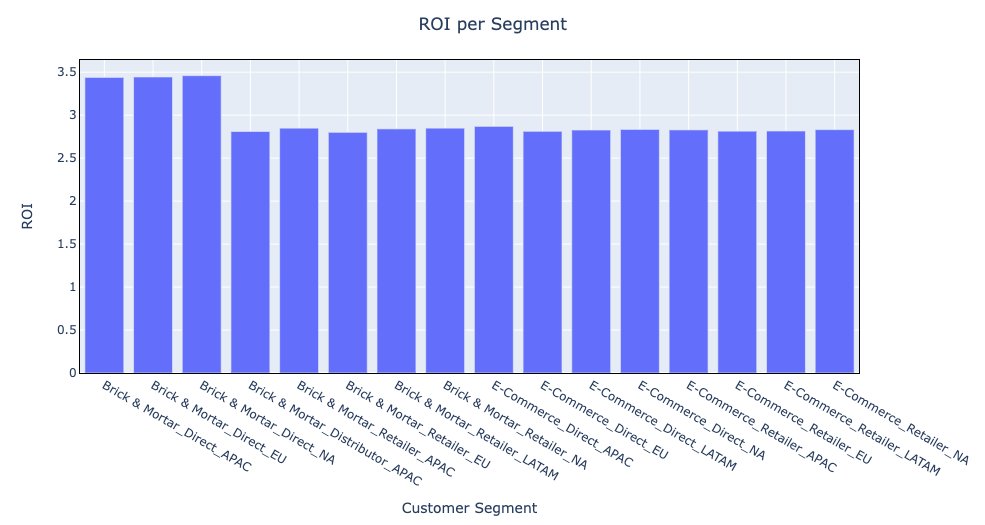

In [13]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot41.png")

###### ROI per segment monthly

In [146]:
ltv_per_segment_monthly.head()

,date,customer_segment,n_customers,revenue,ltv
0,2017-09-01,Brick & Mortar_Direct_APAC,5,13302.296601,2660.459320
1,2017-09-01,Brick & Mortar_Direct_EU,3,1818.055742,606.018581
2,2017-09-01,Brick & Mortar_Direct_NA,1,409.153894,409.153894
3,2017-09-01,Brick & Mortar_Distributor_APAC,4,16018.717129,4004.679282
4,2017-09-01,Brick & Mortar_Retailer_APAC,15,55722.168751,3714.811250


In [147]:
cac_per_segment_monthly.head()

,date,customer_segment,n_customers,order_manufacturing_cost,cac
0,2018-01-01,Brick & Mortar_Direct_APAC,5,4818.9734,963.79
1,2018-01-01,Brick & Mortar_Direct_EU,3,548.8090,182.94
2,2018-01-01,Brick & Mortar_Direct_NA,1,137.1867,137.19
3,2018-01-01,Brick & Mortar_Distributor_APAC,4,6432.9107,1608.23
4,2018-01-01,Brick & Mortar_Retailer_APAC,15,22988.9421,1532.60


In [148]:
# merging tables to extract needed data
roi_per_segment_monthly = (ltv_per_segment_monthly[['date','customer_segment', 'ltv']]
                                  .merge(cac_per_segment_monthly[['date','customer_segment', 'cac']], 
                                                                                        on=['date','customer_segment']))

# calculating ROI per segment
roi_per_segment_monthly['roi'] = roi_per_segment_monthly['ltv'] / roi_per_segment_monthly['cac']
roi_per_segment_monthly.head()

,date,customer_segment,ltv,cac,roi
0,2018-01-01,Brick & Mortar_Direct_APAC,2994.383867,963.79,3.106884
1,2018-01-01,Brick & Mortar_Direct_EU,581.603751,182.94,3.179205
2,2018-01-01,Brick & Mortar_Direct_NA,413.316651,137.19,3.012732
3,2018-01-01,Brick & Mortar_Distributor_APAC,3836.505751,1608.23,2.385545
4,2018-01-01,Brick & Mortar_Retailer_APAC,3827.136081,1532.60,2.497153


In [149]:
# setting color palette
custom_color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
                        '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#aec7e8', '#ffbb78',
                        '#98df8a', '#ff9896', '#c5b0d5', '#c49c94']

# line plot of ROI per segment
fig_roi_per_source_monthly = px.line(roi_per_segment_monthly,
              x='date', 
              y='roi',
              color='customer_segment',
              color_discrete_sequence=custom_color_palette)
fig_roi_per_source_monthly.update_layout(title='ROI per Segment Monthly',
                 title_x=0.5,
                 legend_title='Segment')
# updating the x-axis
fig_roi_per_source_monthly.update_xaxes(showgrid=True,
                 title='Month',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True,)
# updating the y-axis
fig_roi_per_source_monthly.update_yaxes(showgrid=True,
                 title='ROI',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
fig_roi_per_source_monthly.show()

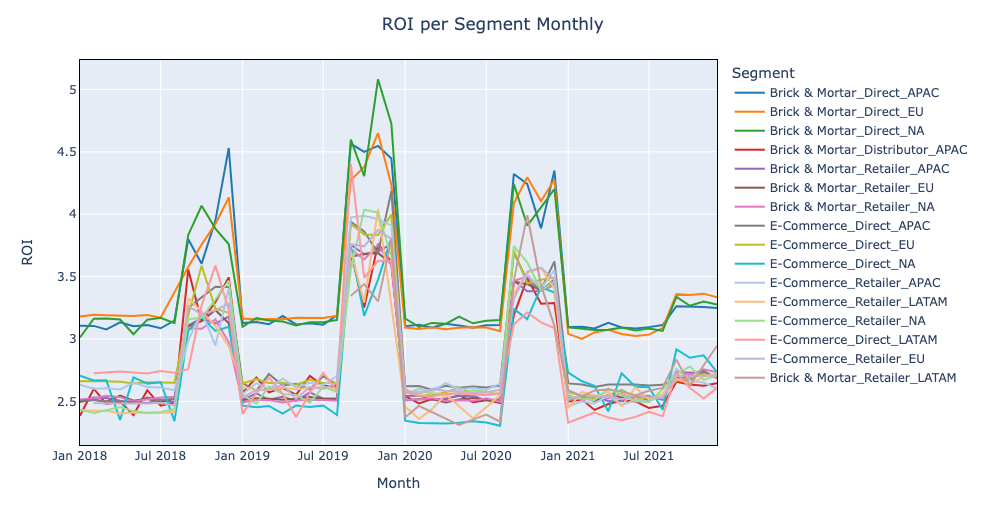

In [14]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot42.png")

##### Conclusions

* ROI tends to grow over time within each cohort, indicating that the profitability of customer acquisition improves as customers continue to engage with the product


* The consistent ROI of 0 every 4 months for October cohorts aligns with the patterns observed in retention, average check, and LTV trends. This might suggest a cyclic behavior in customer engagement or purchase behavior.


* Similar ROI values for cohorts within the same year indicate that customer acquisition efforts and revenue generation are relatively consistent across those cohorts.


* The September and October 2017 cohorts had the highest ROI of 152.89 and 154.46. The initial four months of these cohorts' lifetimes showed an ROI of 0, but afterwards, their ROI grew more faster compared to the 2018 and 2019 cohorts, which had an ROI greater than 0 from the first month of their lifetimes. This interesting pattern might be attributed to certain changes or improvements in business strategies, customer targeting, or product offerings that were implemented during that time.


* The spikes in ROI between August and January each year, with the highest spike in November 2019, could be related to specific seasonal trends or marketing campaigns that tend to generate higher returns during those periods. The lower spike in 2021 might indicate a shift in customer behavior, alterations in the market landscape, or changes in the competitive environment. 


* Segments like Brick&Mortal_Direct_APAC, Brick&Mortal_Direct_EU, and Brick&Mortal_Direct_NA exhibit the highest ROI, indicating successful customer acquisition and revenue generation strategies.

### 2.4 Financial Performance Analysis
Analyze revenue and profits for each customer segment to assess their contribution to the overall business.


#### 2.4.1 Revenue

Revenue is the total amount of money generated from sales.

In [150]:
# adding 'customer_segment' column to 'total_sales_monthly' table
revenue_data = total_sales_monthly.merge(dim_customer[['customer_code', 'customer_segment']], on='customer_code')
revenue_data.head()

,date,product_code,customer_code,fiscal_year,revenue,customer_segment
0,2017-09-01,A0118150101,70002017,2018,720.458412,Brick & Mortar_Direct_APAC
1,2017-10-01,A0118150101,70002017,2018,762.838318,Brick & Mortar_Direct_APAC
2,2017-11-01,A0118150101,70002017,2018,423.799066,Brick & Mortar_Direct_APAC
3,2018-01-01,A0118150101,70002017,2018,197.772897,Brick & Mortar_Direct_APAC
4,2018-02-01,A0118150101,70002017,2018,875.851402,Brick & Mortar_Direct_APAC


In [151]:
# calculating total revenue by customer segment
total_revenue_by_segment = revenue_data.groupby('customer_segment')['revenue'].sum().round(2).reset_index()
total_revenue_by_segment

,customer_segment,revenue
0,Brick & Mortar_Direct_APAC,3302536.34
1,Brick & Mortar_Direct_EU,1024426.35
2,Brick & Mortar_Direct_NA,1229122.97
3,Brick & Mortar_Distributor_APAC,7462837.03
4,Brick & Mortar_Retailer_APAC,15625589.67
5,Brick & Mortar_Retailer_EU,10311381.85
6,Brick & Mortar_Retailer_LATAM,37956.91
7,Brick & Mortar_Retailer_NA,7911141.21
8,E-Commerce_Direct_APAC,3259080.62
9,E-Commerce_Direct_EU,1532546.92


In [152]:
# plotting bar graph of revenue per segment
fig_revenue = px.bar(total_revenue_by_segment,
                   x='customer_segment',
                   y='revenue')
# updating the layout of the plot
fig_revenue.update_layout(title='Total Revenue',
                 title_x=0.5,)
#                 plot_bgcolor='white')
# updating the x-axis
fig_revenue.update_xaxes(showgrid=True,
                 title='Customer Segment',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
# updating the y-axis
fig_revenue.update_yaxes(showgrid=True,
                 title='Revenue',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
fig_revenue.show()

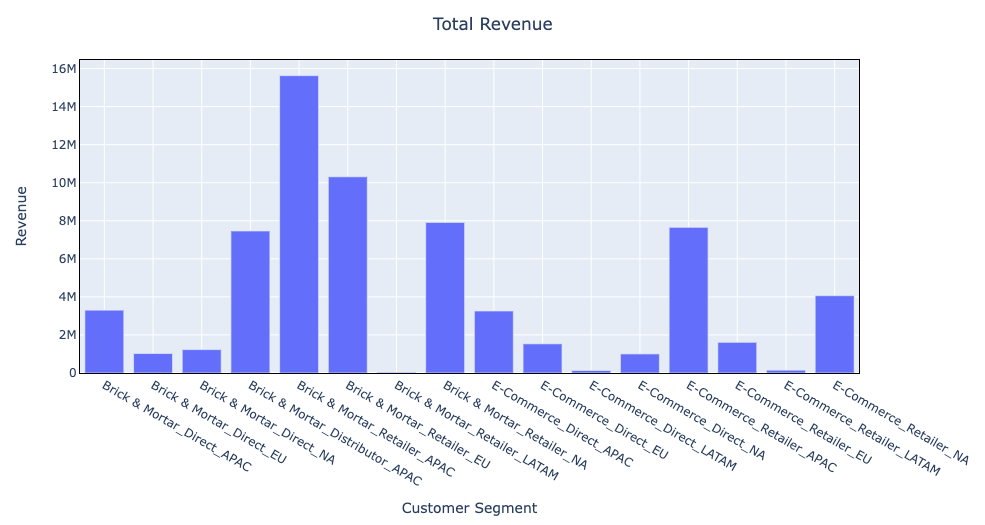

In [15]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot43.png")

##### Conclusions

* The highest revenue is generated by the 'Brick&Mortar_Retailer_APAC' segment, followed by 'Brick&Mortar_Retailer_EU'. 


* On the other hand, 'Brick&Mortal_Retailer_LATAM' exhibits the lowest revenue, followed by 'E-Commerce_Direct_LATAM' and 'E-Commerce_Retailer_LATAM'.


* The LATAM region demonstrates extrimely lower total revenue, which could be attributed to various factors.


* While 'Brick&Mortal_Retailer_LATAM' joined the analysis cohort two years later than other customer segments (in 2019-09-01), contributing to its lower revenue, the other two LATAM segments also display reduced revenue. This could potentially be attributed to market dynamics, regional preferences, or other external factors influencing customer engagement and purchasing behavior in the LATAM region.

#### 2.4.2 Profit

Profit is the amount of money earned after deducting all expenses from revenue.

In [153]:
# merging tables 'revenue_data' and 'total_manufacturing_costs'
profit_data = (revenue_data.merge(total_manufacturing_costs[['date', 
                                                            'product_code', 
                                                            'customer_code', 
                                                            'order_manufacturing_cost']], on=['date',
                                                                                              'product_code', 
                                                                                              'customer_code'])
                           .drop(['fiscal_year', 'product_code', 'customer_code'], axis=1))
profit_data.head()

,date,revenue,customer_segment,order_manufacturing_cost
0,2018-01-01,197.772897,Brick & Mortar_Direct_APAC,64.666
1,2018-02-01,875.851402,Brick & Mortar_Direct_APAC,286.378
2,2018-03-01,847.598131,Brick & Mortar_Direct_APAC,277.140
3,2018-05-01,748.711683,Brick & Mortar_Direct_APAC,244.807
4,2018-06-01,791.091589,Brick & Mortar_Direct_APAC,258.664


In [154]:
# calculating total revenue and total costs per customer segment
profit = profit_data.groupby('customer_segment').agg({'revenue':'sum', 
                                                      'order_manufacturing_cost':'sum'}).round(2).reset_index()
# renaming columns
profit.columns = ['customer_segment', 'total_revenue', 'total_costs']

# calculating ptofit per segment
profit['profit'] = profit['total_revenue'] - profit['total_costs']
profit.head()

,customer_segment,total_revenue,total_costs,profit
0,Brick & Mortar_Direct_APAC,3084306.10,960271.16,2124034.94
1,Brick & Mortar_Direct_EU,966407.83,297443.09,668964.74
2,Brick & Mortar_Direct_NA,1149664.05,355308.45,794355.60
3,Brick & Mortar_Distributor_APAC,6918818.45,2655834.16,4262984.29
4,Brick & Mortar_Retailer_APAC,14537658.26,5485319.24,9052339.02


In [155]:
# plotting bar graph of total profit per segment
fig_profit = px.bar(profit,
                   x='customer_segment',
                   y='profit')
# updating the layout of the plot
fig_profit.update_layout(title='Profit',
                 title_x=0.5,)
#                 plot_bgcolor='white')
# updating the x-axis
fig_profit.update_xaxes(showgrid=True,
                 title='Customer Segment',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
# updating the y-axis
fig_profit.update_yaxes(showgrid=True,
                 title='Profit',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
fig_profit.show()

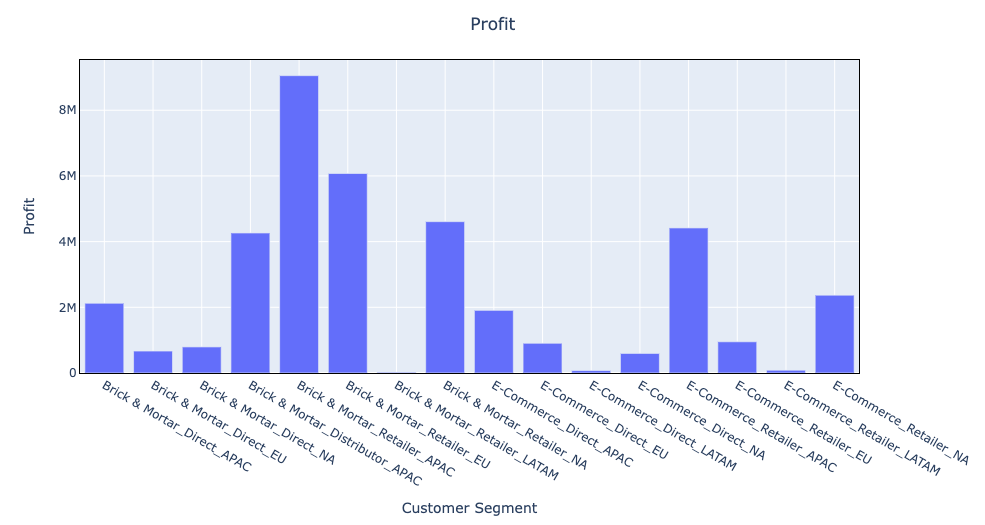

In [16]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot44.png")

Contribution Margin is a financial metric that measures the profitability of sales. Contribution Margin indicates how much money is left over from each sale to cover fixed costs and contribute to profit. A higher Contribution Margin means that a larger proportion of each sale contributes to covering fixed costs and generating profit.

In [156]:
# calculating contribution margin
profit['contribution_margin'] = (profit['profit'] / profit['total_revenue'])
profit.head()

,customer_segment,total_revenue,total_costs,profit,contribution_margin
0,Brick & Mortar_Direct_APAC,3084306.10,960271.16,2124034.94,0.688659
1,Brick & Mortar_Direct_EU,966407.83,297443.09,668964.74,0.692218
2,Brick & Mortar_Direct_NA,1149664.05,355308.45,794355.60,0.690946
3,Brick & Mortar_Distributor_APAC,6918818.45,2655834.16,4262984.29,0.616143
4,Brick & Mortar_Retailer_APAC,14537658.26,5485319.24,9052339.02,0.622682


In [157]:
# bar plot 'Contribution Margin'
fig_contribution_margin = px.bar(profit,
              x='customer_segment', 
              y='contribution_margin')
# updating the layout of the plot
fig_contribution_margin.update_layout(title='Contribution Margin',
                 title_x=0.5,)
#                plot_bgcolor='white')
# updating the x-axis
fig_contribution_margin.update_xaxes(showgrid=True,
                 title='Customer Segment',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
# updating the y-axis
fig_contribution_margin.update_yaxes(showgrid=True,
                 title='Contribution Margin',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True,
                 tickformat='.1%')
fig_contribution_margin.show()

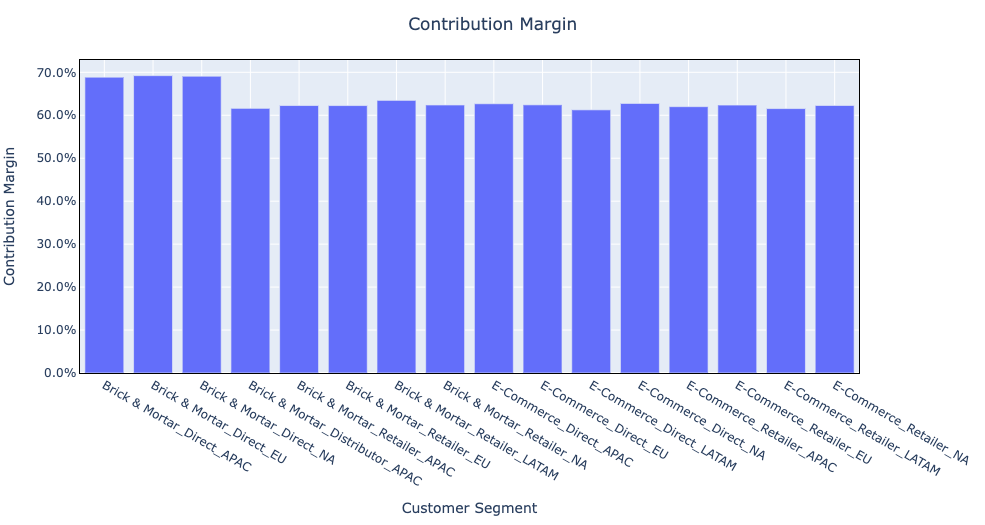

In [17]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot45.png")

##### Conclusions

* The profit per segment graph closely mirrors the total revenue distribution. The segment 'Brick&Mortar_Retailer_APAC' leads with the highest profit, followed by 'Brick&Mortar_Retailer_EU,' while the LATAM region segments show the lowest profitability.


* The highest Contribution Margin is observed in 'Brick&Mortar_Direct_APAC,' 'Brick&Mortar_Direct_EU,' and 'Brick&Mortar_Direct_NA,' all hovering around 69%. However, these three segments exhibit no significant differences in terms of Contribution Margin.


* The remaining segments display slightly lower Contribution Margins, ranging from 61% to 64%.

### 2.5 Product Category Analysis

Identify the most popular product categories among different customer segments.


In [158]:
# merging tables to get needed data
product_category_data = (fact_sales_monthly[['product_code', 'customer_code', 'sold_quantity']]
                         .merge(dim_customer[['customer_code', 'customer_segment']], on='customer_code')
                         .merge(dim_product[['product_code', 'category']], on='product_code')
                         .drop(['product_code', 'customer_code'], axis=1))
product_category_data.head()

,sold_quantity,customer_segment,category
0,51,Brick & Mortar_Direct_APAC,Internal HDD
1,54,Brick & Mortar_Direct_APAC,Internal HDD
2,30,Brick & Mortar_Direct_APAC,Internal HDD
3,14,Brick & Mortar_Direct_APAC,Internal HDD
4,62,Brick & Mortar_Direct_APAC,Internal HDD


In [159]:
# calculating total quantity of units sold for each category and customer segment
popular_category = product_category_data.groupby(['customer_segment', 'category'])['sold_quantity'].sum().reset_index()
popular_category.head()

,customer_segment,category,sold_quantity
0,Brick & Mortar_Direct_APAC,Graphic Card,28675
1,Brick & Mortar_Direct_APAC,Internal HDD,129686
2,Brick & Mortar_Direct_EU,Graphic Card,7455
3,Brick & Mortar_Direct_EU,Internal HDD,40474
4,Brick & Mortar_Direct_NA,Graphic Card,9549


In [160]:
# bar plot 'Product Category by Customer Segment'
fig_popular_category = px.bar(popular_category,
              x='customer_segment', 
              y='sold_quantity',
              color='category')
# updating the layout of the plot
fig_popular_category.update_layout(title='Product Category by Customer Segment',
                 title_x=0.5,
                 legend_title='Product Category')
#                plot_bgcolor='white')
# updating the x-axis
fig_popular_category.update_xaxes(showgrid=True,
                 title='Customer Segment',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True)
# updating the y-axis
fig_popular_category.update_yaxes(showgrid=True,
                 title='Product Category',
                 showline=True,
                 linewidth=1,
                 linecolor='black',
                 mirror=True,)
fig_popular_category.show()

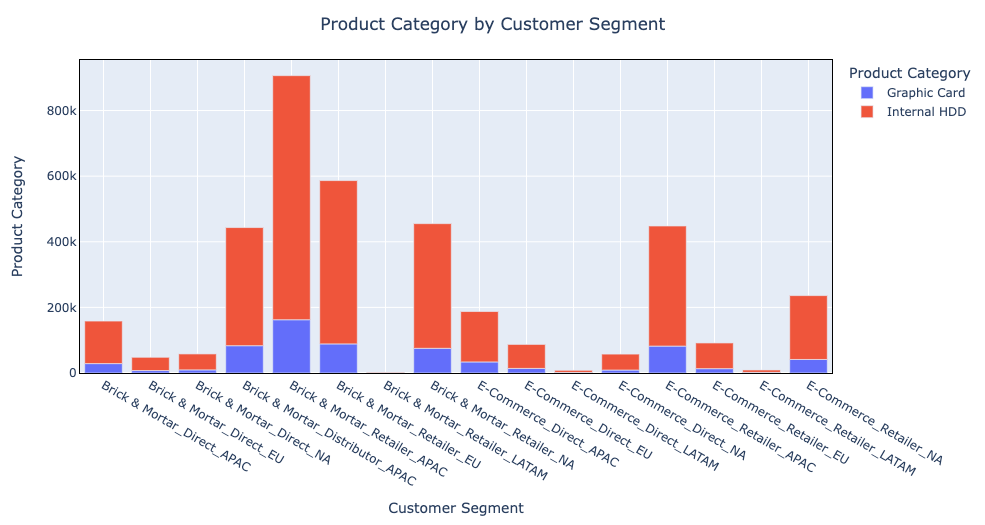

In [18]:
# adding picture of graph
display.Image("/Users/kseniyagormash/Desktop/Pics/newplot46.png")

#### Conclusions

The 'Product Category by Customer Segment' graph indicates that all customers from all customer segments order products from only two categories: 'Graphic Card' and 'Internal HDD' with a significant preference to 'Internal HDD' category.


## Stage 3. Hypothesis testing

In [161]:
total_sales_monthly.head()

,date,product_code,customer_code,fiscal_year,revenue
0,2017-09-01,A0118150101,70002017,2018,720.458412
1,2017-10-01,A0118150101,70002017,2018,762.838318
2,2017-11-01,A0118150101,70002017,2018,423.799066
3,2018-01-01,A0118150101,70002017,2018,197.772897
4,2018-02-01,A0118150101,70002017,2018,875.851402


In [162]:
dim_customer.head()

,customer_code,customer,platform,channel,market,sub_zone,region,customer_segment
0,70002017,Atliq Exclusive,Brick & Mortar,Direct,India,India,APAC,Brick & Mortar_Direct_APAC
1,70002018,Atliq e Store,E-Commerce,Direct,India,India,APAC,E-Commerce_Direct_APAC
2,70003181,Atliq Exclusive,Brick & Mortar,Direct,Indonesia,ROA,APAC,Brick & Mortar_Direct_APAC
3,70003182,Atliq e Store,E-Commerce,Direct,Indonesia,ROA,APAC,E-Commerce_Direct_APAC
4,70004069,Atliq Exclusive,Brick & Mortar,Direct,Japan,ROA,APAC,Brick & Mortar_Direct_APAC


### 3.1 Hypothesis 1

Customers with a higher Customer Lifetime Value are more likely to purchase products   from the ‘E-Commerce’ platform compared to ‘Brick & Mortar’ platform at AtliQ Hardware.

In [163]:
# extracting needed data by merging 'fact_sales_monthly' and 'dim_customer' tables
data = (total_sales_monthly[['date', 'customer_code', 'fiscal_year', 'revenue']]
                  .merge(dim_customer[['customer_code', 'region', 'platform']],on='customer_code'))
data.head()

,date,customer_code,fiscal_year,revenue,region,platform
0,2017-09-01,70002017,2018,720.458412,APAC,Brick & Mortar
1,2017-10-01,70002017,2018,762.838318,APAC,Brick & Mortar
2,2017-11-01,70002017,2018,423.799066,APAC,Brick & Mortar
3,2018-01-01,70002017,2018,197.772897,APAC,Brick & Mortar
4,2018-02-01,70002017,2018,875.851402,APAC,Brick & Mortar


In [164]:
# calculating number of customers and revenue per platform
ltv_per_platform = data.groupby('platform').agg({'customer_code':'nunique',
                                                 'revenue':'sum'}).round(2).reset_index()
# renaming columns
ltv_per_platform.columns = ['platform','n_customers','revenue']

# calculating LTV per platform
ltv_per_platform['ltv'] = round(ltv_per_platform['revenue'] / ltv_per_platform['n_customers'], 2)
ltv_per_platform.head() 

,platform,n_customers,revenue,ltv
0,Brick & Mortar,150,46904992.33,312699.95
1,E-Commerce,59,19407387.46,328938.77


In [165]:
# defining samples to test
ltv_ecommerce = ltv_per_platform[ltv_per_platform['platform'] == 'E-Commerce']['ltv']
ltv_brick_mortar = ltv_per_platform[ltv_per_platform['platform'] == 'Brick & Mortar']['ltv']

In [166]:
# creating a function to perform a two-sample t-test
def test(sample1,sample2):
    alpha=0.05
    t_statistic, p_value = stats.ttest_ind(ltv_ecommerce, ltv_brick_mortar, equal_var=False)
    if p_value < alpha:
        print('Reject null hypothesis: There is no significant difference.')
    else:
        print('Fail to reject null hypothesis: There is no significant difference.')

In [167]:
#testing the hypothesis 
test(ltv_ecommerce, ltv_brick_mortar)

Fail to reject null hypothesis: There is no significant difference.


/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3723: RuntimeWarning:

Degrees of freedom <= 0 for slice

/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:254: RuntimeWarning:

invalid value encountered in double_scalars



#### Conclusions

Hypothesis 1 is not confirmed. The test results indicate that there is no significant difference in Customer Lifetime Value between the 'Brick & Mortar' and 'E-Commerce' platforms at AtliQ Hardware. 

### 3.2 Hypothesis 2

Customers in the ‘EU’ region exhibit higher customer loyalty and retention rates compared to customers in other regions at AtliQ Hardware.

In [168]:
### calculating customer retention rates by region

# extracting first visit day per customer and region
retention_by_region = data.groupby(['region', 'customer_code'])['date'].min().reset_index()

# determining if each customer is retained or not
retention_by_region['is_retained'] = retention_by_region['date'] < retention_by_region['date'].max()

# calculating retention rates for each region 
retention_by_region = round(retention_by_region.groupby('region')['is_retained'].mean() * 100, 2)
retention_by_region = retention_by_region.reset_index()
retention_by_region

,region,is_retained
0,APAC,94.37
1,EU,93.33
2,LATAM,85.71
3,NA,100.00


In [169]:
# calculating loyalty metrics: average purchase frequency and average check by region
loyalty_metrics = data.groupby('region').agg({'customer_code': ['count', 'nunique'], # number of orders and customers
                                                                'revenue': 'median'}) # average check
# renaming columns
loyalty_metrics.columns = ['n_orders', 'n_customers', 'avg_check']

# calculating average frequency 
loyalty_metrics['avg_frequency'] = (loyalty_metrics['n_orders'] / loyalty_metrics['n_customers']).astype(int)
loyalty_metrics.drop(['n_orders', 'n_customers'], axis=1).reset_index()

,region,avg_check,avg_frequency
0,APAC,554.493729,333
1,EU,191.123727,300
2,LATAM,106.022867,280
3,NA,575.838397,384


In [170]:
# defining retention samples to test for the two regions - EU and other regions
eu_retention = retention_by_region[retention_by_region['region'] == 'EU']['is_retained']
other_regions_retention = retention_by_region[retention_by_region['region'] != 'EU']['is_retained']

# defining frequency samples to test for the two regions - EU and other regions
eu_frequency = loyalty_metrics.loc['EU', 'avg_frequency']
other_regions_frequency = loyalty_metrics.loc[loyalty_metrics.index != 'EU', 'avg_frequency']

# defining average check samples to test for the two regions - EU and other regions
eu_avg_check = loyalty_metrics.loc['EU', 'avg_check']
other_regions_avg_check = loyalty_metrics.loc[loyalty_metrics.index != 'EU', 'avg_check']

In [171]:
# Perform the two-sample t-test for retention rates
print("Testing Retention Rates:")
test(eu_retention, other_regions_retention)

# Perform the two-sample t-test for average frequency
print("\nTesting Average Frequency:")
test(eu_frequency, other_regions_frequency)

# Perform the two-sample t-test for average check
print("\nTesting Average Check:")
test(eu_avg_check, other_regions_avg_check)

Testing Retention Rates:
Fail to reject null hypothesis: There is no significant difference.

Testing Average Frequency:
Fail to reject null hypothesis: There is no significant difference.

Testing Average Check:
Fail to reject null hypothesis: There is no significant difference.


/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3723: RuntimeWarning:

Degrees of freedom <= 0 for slice

/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:254: RuntimeWarning:

invalid value encountered in double_scalars



#### Conclusions

Based on the statistical tests conducted, we fail to reject the null hypothesis for all three tests:
1. Retention Rates: We do not find a significant difference in customer retention rates between the 'EU' region and other regions at AtliQ Hardware.
2. Average Frequency: We do not find a significant difference in the average purchase frequency between the 'EU' region and other regions at AtliQ Hardware.
3. Average Check: We do not find a significant difference in the average check between the 'EU' region and other regions at AtliQ Hardware.

Hypothesis 2 is not confirmed.

### 3.3 Hypothesis 3

Customers in the ‘Retailer’ channel exhibit higher product category diversity in their purchases compared to customers in the ‘Direct’ and ‘Distributor’ channels at AtliQ Hardware.

#### Conclusions

The 'Product Category by Customer Segment' graph indicates that all customers from all customer segments order products from only two categories: 'Graphic Card' and 'Internal HDD'. Therefore, testing this hypothesis is unnecessary. There is no difference in customers product category diversity between the channels.  Hypothesis 3 is not confirmed.

## Findings and recommendations

In this project, "Customer Analysis - Segmentation of Customers" for AtliQ Hardware, we conducted a comprehensive analysis of various aspects including customer behavior, Customer Lifetime Value (LTV), Customer Acquisition Cost (CAC), Financial Performance Analysis, and Product Category Analysis. By segmenting customers into 16 distinct groups based on platform, channel, and region, we gained an understanding of their preferences. 

Our analysis also included hypothesis testing:
1.	Hypothesis 1: Customers with a higher Customer Lifetime Value are more likely to purchase products   from the ‘E-Commerce’ platform compared to ‘Brick & Mortar’ platform at AtliQ Hardware.
2. Hypothesis 2: Customers in the ‘EU’ region exhibit higher customer loyalty and retention rates compared to customers in other regions at AtliQ Hardware.
3. Hypothesis 3: Customers in the ‘Retailer’ channel exhibit higher product category diversity in their purchases compared to customers in the ‘Direct’ and ‘Distributor’ channels at AtliQ Hardware.

All three hypothesis were not confirmed. 


Also, we developed a Tableau dashboard for RFM customer segmentation analysis, categorizing customers into specific groups:
* Best: Active and frequent buyers who spend generously.
* Loyal: Consistently high spenders who respond well to promotions.
* Potential Loyalists: Recent, valuable repeat buyers.
* Promising:  This customer segment is recent shoppers, but hasn’t spent much.
* New Customers: Recently joined, infrequent buyers.
* Need Attention: Above-average metrics but recent inactivity.
* About to Sleep: Below-average engagement, need reactivation.
* At-Risk: Valuable but haven't purchased recently.

The interactive dashboard offers a comprehensive overview with visual representations and insightful metrics. You can customize the analysis by filtering data using 'Fiscal Year' and 'Customer Segment' dropdowns. It provides valuable insights into revenue trends, average order values, and customer behavior.

Link to the Tableau dashboard: https://public.tableau.com/views/RMFCustomerSegmentation/Dashboard1?:language=en-US&:display_count=n&:origin=viz_share_link

Based on this analysis, we have derived meaningful conclusions and formulated corresponding recommendations. Here is a summary of our findings:

###### Conclusions

Customer Behavior Analysis:
* Each cohort demonstrated a distinct cyclical pattern in retention rates over a four-month period. September cohorts exhibited a notable trend with 100% retention every fourth month, indicating strong customer engagement during specific periods. October cohorts showed relatively consistent retention rates, with periodic drops in retention during January, May, and September. Churn rate mirrored the retention pattern, with significant spikes during the pandemic, particularly in March, April, and June 2020.

* An overall monthly retention rate of 85.2% suggests a healthy level of customer engagement and loyalty. Among different customer segments, 11 out of 16 exhibited a perfect retention rate of 100%, indicating a high level of customer loyalty. However, the 'E-Commerce_Retailer_LATAM' segment showed a lower retention rate of 66.67%.

* The average check consistently increased over the lifetime of each cohort, indicating a positive correlation between longer customer relationships and higher spending. Seasonal spikes in average check were observed during holiday months, such as November and December. Across customer segments, a gradual growth trend in average check was evident over time, with a significant rise observed after August 2021.

* The average number of orders per customer per cohort (order frequency) increased over the years, reaching a peak of 11 orders before dropping to 9 in 2022.

LTV and CAC Analysis:
* LTV demonstrates consistent growth over time within each cohort, signifying enduring customer engagement and repeated purchases. The 2017 October cohort stands out with the highest overall LTV, suggesting customers from this cohort have exhibited robust loyalty and spending. The cyclic pattern of LTV drops every 4 months for October cohorts mirrors retention and average check trends, revealing potential cyclical spending behavior. 'Brick%Mortal_Distributor_APAC' segment showcases the highest LTV, while LATAM segments show lower figures.

* The overall CAC trend aligns with LTV patterns, particularly the 'Brick%Mortal_Distributor_APAC' segment, indicating higher acquisition costs for more valuable customers. Monthly CAC per segment also follows the LTV trend.

* ROI shows growth within each cohort over time, illustrating the increasing profitability of customer acquisition as engagement extends. Consistent ROI values every 4 months for October cohorts correspond with retention, average check, and LTV trends, suggesting potential cyclical engagement patterns. Similar ROI values for cohorts within the same year highlight consistent acquisition efforts and revenue generation.

* LTV is consistently higher than CAC for all customer segments. This indicates that, on average, the company is generating more revenue from each customer over their entire lifecycle than it spends to acquire those customers. This healthy per customer economics implies that the company's efforts in acquiring and retaining customers are effectively contributing to its overall profitability. It's a strong indicator that the business is on the right track and can expect to achieve sustainable growth over time.

Financial Performance Analysis:
* The highest revenue is generated by the 'Brick&Mortar_Retailer_APAC' segment, followed by 'Brick&Mortar_Retailer_EU'. These segments stand out as strong revenue contributors. In contrast, the LATAM region segments exhibit lower revenue figures, which could be influenced by various factors. While 'Brick&Mortal_Retailer_LATAM' joined the analysis cohort two years later, impacting its revenue, the other two LATAM segments also display reduced revenue. Market dynamics, regional preferences, or external factors might be affecting customer engagement and purchasing behavior in the LATAM region.

* Profit per segment closely follows the revenue distribution pattern, with 'Brick&Mortar_Retailer_APAC' leading in profitability, followed by 'Brick&Mortar_Retailer_EU.' LATAM region segments show lower profitability in comparison.

* The analysis indicates that 'Brick&Mortar_Direct_APAC,' 'Brick&Mortar_Direct_EU,' and 'Brick&Mortar_Direct_NA' segments demonstrate the highest Contribution Margins, hovering around 69%. The remaining segments exhibit slightly lower Contribution Margins, ranging from 61% to 64%. While the exact differences are not significant, understanding and optimizing Contribution Margin across all segments can help improve overall profitability.

Product Category Analysis:
* The Product Category Analysis reveals a clear trend across all customer segments. Customers from every segment order products from the 'Graphic Card' and 'Internal HDD' categories with a significant preference to 'Internal HDD' category.

COVID-19:
* COVID-19 had a significant impact on all metrics and segments, leading to drops in retention, order frequency, and revenue. However, recovery was observed after the initial impact.

Growth:
* The rapid growth observed after August 1, 2021, could be attributed to several factors that align with the shift in customer behavior and engagement patterns. While the exact reasons may vary, here are some potential explanations for the significant growth observed during this period: economic recovery, new product launches, effective marketing strategies, and others. During the pandemic, many customers may have delayed their purchases due to lockdowns and economic instability. As restrictions eased and conditions improved, this pent-up demand could be unleashed, leading to a surge in orders and spending. 

RFM customer segmentation analysis:
* The most prominent groups are Loyal customers, followed by Potential Loyalists and Promising customers.

* Best, Loyal, Potential Loyalists, and Promising customers have shown the highest levels of engagement, with recent orders and high order frequency. About to Sleep, At Risk, Need Attention, and Newest customers have made their last orders within the past 30 days.

* Newest and Best customers demonstrate the highest monetary value, contributing significantly to overall revenue. At Risk and Promising customers represent lower monetary value.

* Loyal customers generate the highest total revenue, while At Risk and About to Sleep customers contribute the lowest revenue. This highlights the importance of retaining and engaging Loyal customers for sustained growth.

* Best and Newest customers exhibit the highest order frequency and total number of orders. At Risk and Promising customers make fewer purchases.

* The highest average order check is observed among Newest customers, closely followed by Best and Loyal customers. Best customers have the highest average order size, reflecting their tendency to purchase more items per order.

* Revenue shows spikes in November and December, likely due to holiday-related spending. A drop is observed in March 2020, attributed to the impact of COVID-19. However, Best customers experienced a drop in April, possibly indicating a unique response to external events.

###### Recommendations:

* Long-term Relationship Building: Focus on building and nurturing long-term relationships with customers, particularly those displaying strong loyalty. Tailor communication and offers to their preferences, maximizing their lifetime value.
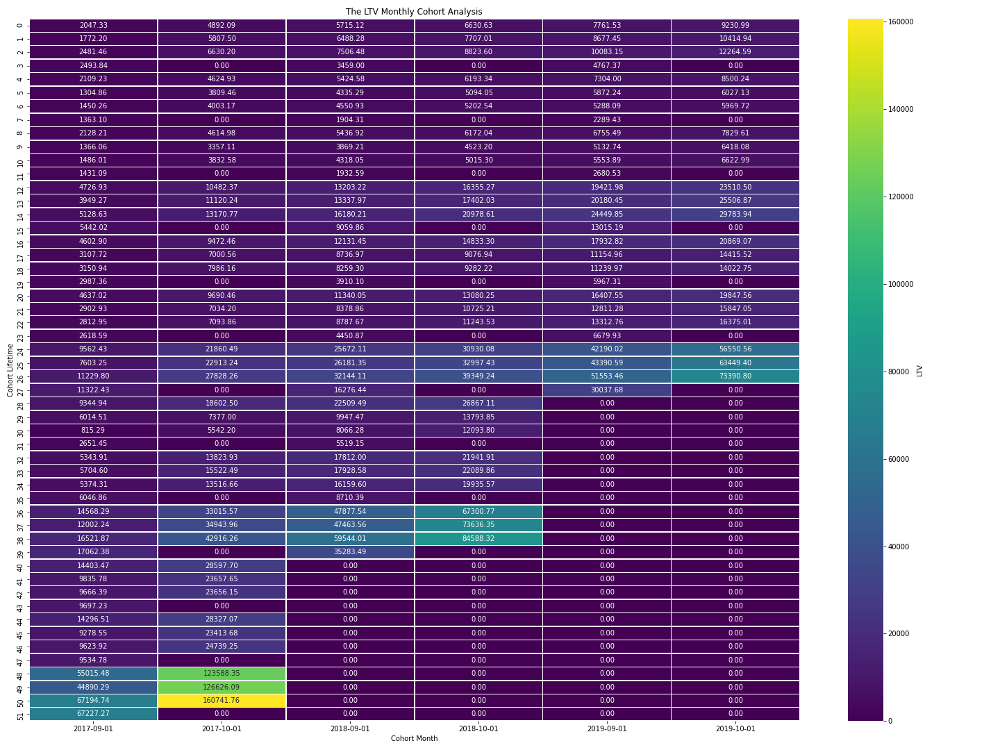

* Untapped Customer Segments: The analysis suggests that certain segments, such as 'Brick%Mortal_Distributor_APAC,' have untapped potential. This segment has demonstrated strong loyalty and revenue generation with minimal customers, indicating growth opportunities. We neen to attract more distributors.
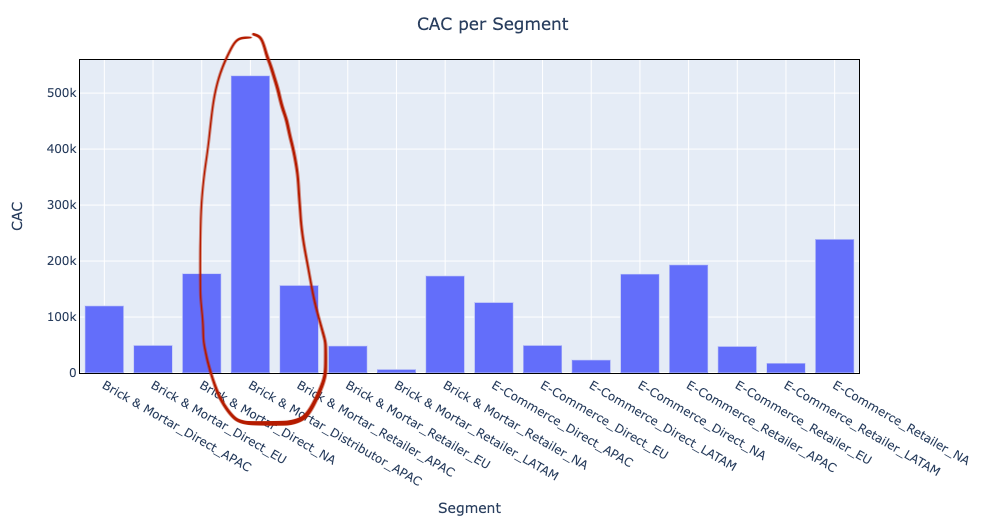

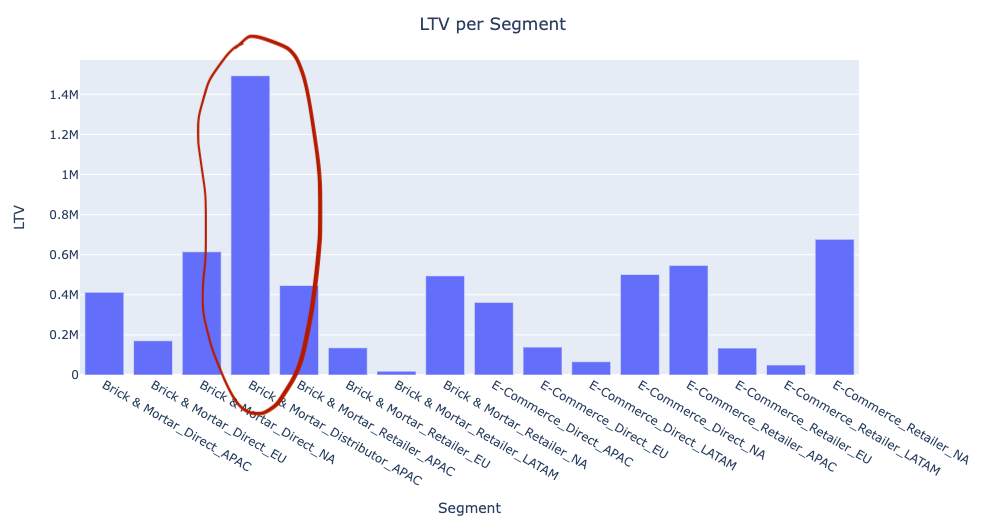

* High Growth Potential Segments: 'Brick%Mortal_Retailer_APAC' stands out as a segment with high growth potential due to its exceptional performance. Targeting similar retailer segments and exploring strategies to replicate this success could drive business expansion. Most retailers show good results. We need to attract more retailers.
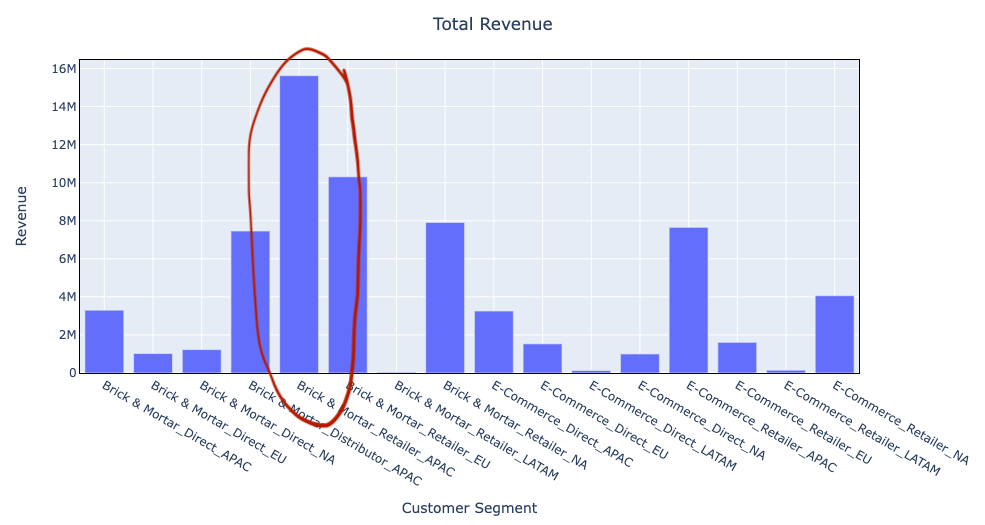

* Increase Customer Engagement: Use the observed four-month retention cycle to plan targeted engagement strategies during periods of potential drop-offs. Use analytics to offer personalized promotions and keep customers engaged. Focus on retaining Loyal customers, as they contribute significantly to revenue. Implement personalized strategies for Potential Loyalists and Promising customers to further engage and convert them into Loyal customers. Leverage the high engagement of Newest customers by introducing them to a variety of products and encouraging repeat purchases to build loyalty. Identify and address factors leading to the At Risk segment to prevent potential churn. Engage with these customers through targeted campaigns, offers, or customer support to re-engage them.
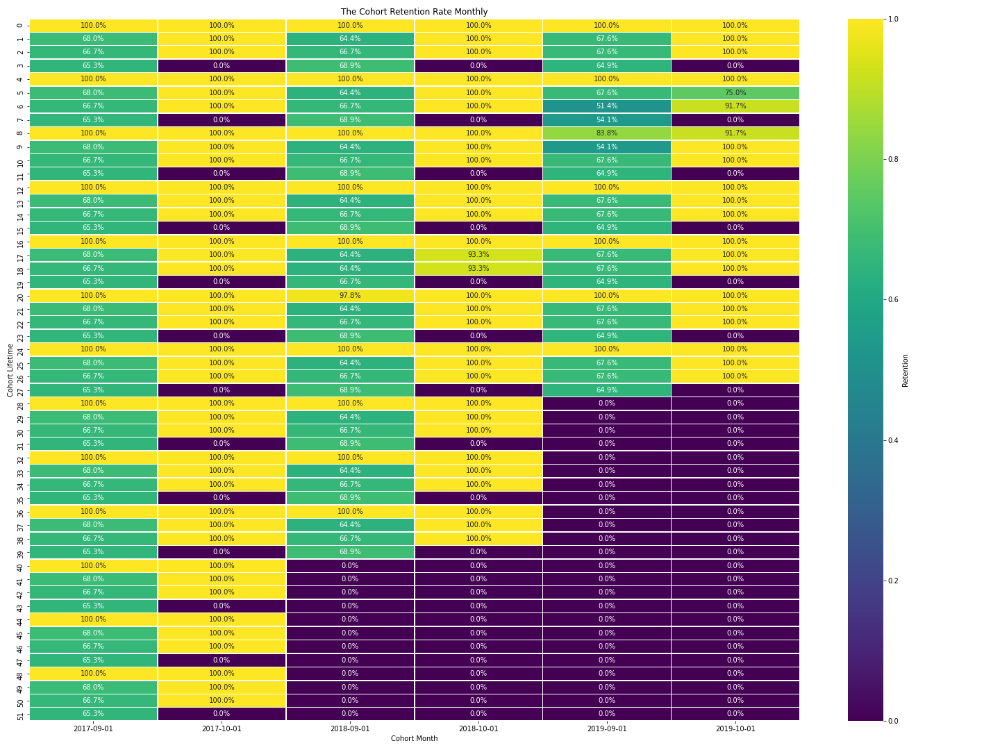

* Mitigate the impact of COVID-19: Develop contingency plans to manage external disruptions such as COVID-19. Use the lessons of the pandemic to create sustainable strategies that ensure customer acquisition and revenue generation even during difficult times.



* Focus on High-Performing Segments: The segments with higher revenue and profitability, such as 'Brick&Mortar_Retailer_APAC' and 'Brick&Mortar_Retailer_EU,' should be further examined to identify the factors driving their success. Consider expanding strategies from these segments to other customer segments to replicate positive outcomes.



* Holiday Optimization: Strategically plan marketing initiatives around holiday seasons to capitalize on increased spending patterns.



* Segment-Specific Campaigns: Crafting targeted marketing campaigns based on customer behavior and preferences could lead to higher customer retention and increased revenue.



* LATAM Region: Lower metrics of LATAM segments may result from economic challenges, currency fluctuations, and regional preferences. To address this, AtliQ can localize marketing (with the preferences and cultural nuances of the LATAM audience), optimize product offerings, adjust pricing, improve customer engagement, form partnerships, conduct market research, and provide customer education. These steps can boost spending and revenue in the LATAM region.

* Product Category Optimization: Capitalize on the preference for 'Graphic Card' and 'Internal HDD' categories by optimizing product offerings, marketing, and promotions within these categories.
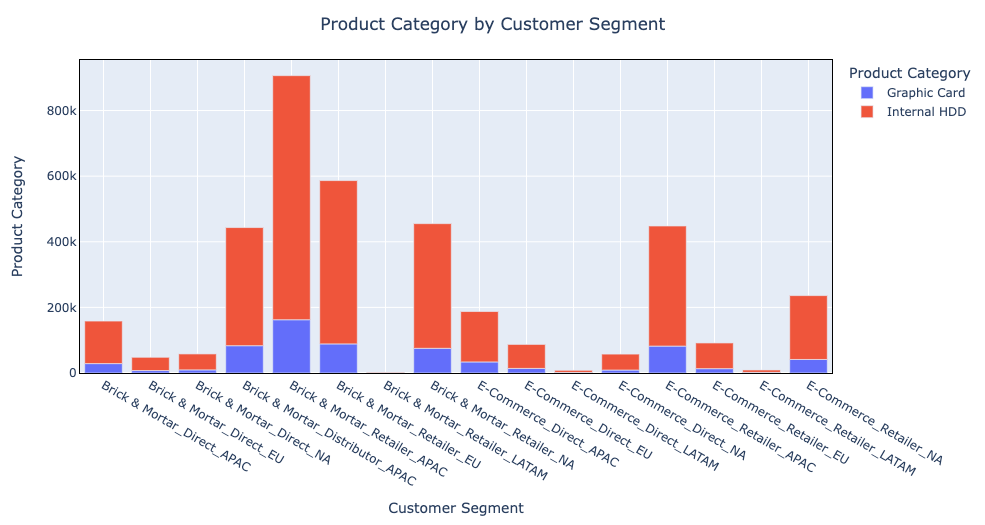